<a href="https://colab.research.google.com/github/ace26597/Acea-Smart-Water-Analytics/blob/main/acea_all.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as pl
from pylab import rcParams
import statsmodels.api as sm
import plotly.express as px
from datetime import date
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error
import warnings
warnings.filterwarnings("ignore")
 
plt.style.use('seaborn-whitegrid')

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Import Data

#**Targeting Water Bodies - A reconstruction of Factors affecting water distribution**

Water becomes not an essential commodity but one that is inextricably linked to the existence of basic life. Scarcity of water affects all life that exists in its vicinity. Because there have been efforts to even privatise water production and its availability, it is all the more important to address not only the environmental issues regaring water withdrawal but also the challenges faced by facetious corporations which treat water not as a basic human right but as a means of commerce. This analytical framework that we shall put forward will deal with water scarcity in a basin and its problematics. The emphasis would be to help Acea group to deal with the aforementioned problematics that arise in tandem with water preservation and the need for discourse surrounding the analyses of prediction as well as the groud realities reagarding the same.

# Problem definition

Since Acea Groups is an Italian multiutility operator, we are looking at datasets containing information about waterbodies in Italy. The distribution of datasets for the type of waterbody is different. There are four waterbody types: aquifer, water spring, lake and river. The datasets are not equally distributed over the waterbody types, as shown below. Since we are working with different waterbodies, we also have different features.

Let's check which are column categories the datasets have in common. As shown below, the columns Date, Rainfall and Temperature appear in all datasets. The columns Lake Level and Volume are waterbody unique columns. Additionally, for each waterbody a different feature has to be predicted. In below figure the target variable is marked with a lightblue box.

The goal is to create four mathematical models, one for each category of waterbody (acquifers, water springs, river, lake) to predict the amount of water in each unique waterbody for a set time interval. The predictive power of the models shall be evaluated with both Mean Absolute Error (MAE) and Root Mean Square Error (RMSE).

# Summary


The locus of our survey that arises out of the data available to us would put forward not one but multiple exploratory branches, the first of which would mean to overview dataset features affecting water bodies and target variables that has to be predicted. The second spear point of perception would be exploratory data analysis containing correlation matrix, Null values analysis and stationarity test as time-series are time-dependane and show specifir characteristics, such as trend and seasonality. Right at the end of this particular train of thought we find ourselves in a space where data preprocessing which includes filling of Null values, feature selection and exterminating the old data is done efficiently. The method with which we will go forward in order to achieve and expand the implications of these objectives would be to create a model for prediction that will essentially enable a sub-model for future scope.

#Dataset Overview

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
Aquifer_Auser = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Auser.csv')
Aquifer_Doganella = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Doganella.csv')
Aquifer_Luco = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Luco.csv')
Aquifer_Petrignano = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Petrignano.csv')
Lake_Bilancino = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Lake_Bilancino.csv')
River_Arno  = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/River_Arno.csv')
Water_Spring_Amiata = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Water_Spring_Amiata.csv')
Water_Spring_Lupa = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Water_Spring_Lupa.csv')
Water_Spring_Madonna_di_Canneto = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Water_Spring_Madonna_di_Canneto.csv')

Aquifer_Auser['Date'] = pd.to_datetime(Aquifer_Auser['Date'], dayfirst=True)
Aquifer_Doganella['Date'] = pd.to_datetime(Aquifer_Doganella['Date'], dayfirst=True)
Aquifer_Luco['Date'] = pd.to_datetime(Aquifer_Luco['Date'], dayfirst=True)
Aquifer_Petrignano['Date'] = pd.to_datetime(Aquifer_Petrignano['Date'], dayfirst=True)
Lake_Bilancino['Date'] = pd.to_datetime(Lake_Bilancino['Date'], dayfirst=True)
River_Arno['Date'] = pd.to_datetime(River_Arno['Date'], dayfirst=True)
Water_Spring_Amiata['Date'] = pd.to_datetime(Water_Spring_Amiata['Date'], dayfirst=True)
Water_Spring_Lupa['Date'] = pd.to_datetime(Water_Spring_Lupa['Date'], dayfirst=True)
Water_Spring_Madonna_di_Canneto['Date'] = pd.to_datetime(Water_Spring_Madonna_di_Canneto['Date'], dayfirst=True)

Aquifer_Auser_target = ['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
Aquifer_Doganella_target = ['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2','Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4','Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6','Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8','Depth_to_Groundwater_Pozzo_9']
Aquifer_Luco_target = ['Depth_to_Groundwater_Podere_Casetta']
Aquifer_Petrignano_target = ['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
Lake_Bilancino_target = ['Lake_Level', 'Flow_Rate']
River_Arno_target = ['Hydrometry_Nave_di_Rosano']
Water_Spring_Amiata_target = ['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
Water_Spring_Lupa_target = ['Flow_Rate_Lupa']
Water_Spring_Madonna_di_Canneto_target = ['Flow_Rate_Madonna_di_Canneto']

dataset = ['Aquifer_Auser','Aquifer_Doganella','Aquifer_Luco','Aquifer_Petrignano','Lake_Bilancino','River_Arno','Water_Spring_Amiata','Water_Spring_Lupa','Water_Spring_Madonna_di_Canneto']
all_data = [Aquifer_Auser,Aquifer_Doganella,Aquifer_Luco,Aquifer_Petrignano,Lake_Bilancino,River_Arno,Water_Spring_Amiata,Water_Spring_Lupa,Water_Spring_Madonna_di_Canneto]
all_data_target = [Aquifer_Auser_target,Aquifer_Doganella_target,Aquifer_Luco_target,Aquifer_Petrignano_target,Lake_Bilancino_target,River_Arno_target,Water_Spring_Amiata_target,Water_Spring_Lupa_target,Water_Spring_Madonna_di_Canneto_target]

In [ ]:
import itertools
ab = itertools.chain(col for col in all_data_target)
all = list(ab)
all_targets = [item for sublist in all for item in sublist]
all_targets

['Depth_to_Groundwater_SAL',
 'Depth_to_Groundwater_CoS',
 'Depth_to_Groundwater_LT2',
 'Depth_to_Groundwater_Pozzo_1',
 'Depth_to_Groundwater_Pozzo_2',
 'Depth_to_Groundwater_Pozzo_3',
 'Depth_to_Groundwater_Pozzo_4',
 'Depth_to_Groundwater_Pozzo_5',
 'Depth_to_Groundwater_Pozzo_6',
 'Depth_to_Groundwater_Pozzo_7',
 'Depth_to_Groundwater_Pozzo_8',
 'Depth_to_Groundwater_Pozzo_9',
 'Depth_to_Groundwater_Podere_Casetta',
 'Depth_to_Groundwater_P24',
 'Depth_to_Groundwater_P25',
 'Lake_Level',
 'Flow_Rate',
 'Hydrometry_Nave_di_Rosano',
 'Flow_Rate_Bugnano',
 'Flow_Rate_Arbure',
 'Flow_Rate_Ermicciolo',
 'Flow_Rate_Galleria_Alta',
 'Flow_Rate_Lupa',
 'Flow_Rate_Madonna_di_Canneto']

Flow rate absolute value(discussions)

In [ ]:
Lake_Bilancino['Flow_Rate'] = Lake_Bilancino['Flow_Rate'].abs()
Water_Spring_Amiata['Flow_Rate_Bugnano'] = Water_Spring_Amiata['Flow_Rate_Bugnano'].abs()
Water_Spring_Amiata['Flow_Rate_Arbure'] = Water_Spring_Amiata['Flow_Rate_Arbure'].abs()
Water_Spring_Amiata['Flow_Rate_Ermicciolo'] = Water_Spring_Amiata['Flow_Rate_Ermicciolo'].abs()
Water_Spring_Amiata['Depth_to_Groundwater_David_Lazzaretti'] = Water_Spring_Amiata['Depth_to_Groundwater_David_Lazzaretti'].abs()
Water_Spring_Amiata['Flow_Rate_Galleria_Alta'] = Water_Spring_Amiata['Flow_Rate_Galleria_Alta'].abs()
Water_Spring_Lupa['Flow_Rate_Lupa'] = Water_Spring_Lupa['Flow_Rate_Lupa'].abs()
Water_Spring_Madonna_di_Canneto['Flow_Rate_Madonna_di_Canneto'] = Water_Spring_Madonna_di_Canneto['Flow_Rate_Madonna_di_Canneto'].abs()

boxplot and null values graph functions

In [ ]:
def box_plot(acea_df,acea_df_target):
  acea_df.replace(0, np.nan, inplace=True)
  acea_df.dropna(subset=['Date'],inplace=True)
  acea_df['year'] = [d.year for d in acea_df.Date]
  acea_df['month'] = [d.strftime('%b') for d in acea_df.Date]
  years = acea_df['year'].unique()
  for target in acea_df_target:
    fig, axes = plt.subplots(1, 2, figsize=(20,7), dpi= 80)
    sns.boxplot(x='year', y=target, data=acea_df, ax=axes[0])
    sns.boxplot(x='month', y=target, data=acea_df.loc[~acea_df.year.isin([1998, 2020]), :])
    # Set Title
    axes[0].set_title('Year-wise Box Plot\n(The Trend)', fontsize=18); 
    axes[1].set_title('Month-wise Box Plot\n(The Seasonality)', fontsize=18)
    plt.show()
  return acea_df

def nagraph(name,acea_df):
    f, ax = plt.subplots(nrows=1, ncols=1, figsize=(20,5))
    sns.heatmap(acea_df.T.isna(), cmap='Blues')
    ax.set_title(name)
    plt.show()

# Exploratory Data Analysis

In this section, we are going to explore the datasets.

Let's get a feeling about how many years of data we are looking at for each dataset. For the datasets for aquifer Auser, aquifer Luco, river Arno, and water spring Amiata, we have more than 20 years of data. On the other side, water spring Madonna only contains information about the past 8 years. We will be looking at indepentadant and target variables through visualizaition, Correlation matrices for checking the extent of dependency of independent variable on target variable, total null values present in each dataset, statisctical view for getting good grasp of type of data that exists in these columns. Also we will seeing boxplots in periods of years and months for checking treand and seasonality respectively if any.

##Correlation Definition
One of the pillars of any EDA is to look for correlation between variables, i.e. the Pearson correlation coefficient. The Pearson correlation coefficient between two random variables  X  and  Y  is defined as:

ρX,Y=E[(X−μX)(Y−μY)]σXσY  , further details here

Actually what we use is the Sample Pearson Correlation Coefficient, defined as:

rxy=∑ni=1(xi−x¯)(yi−y¯)∑ni=1(xi−x¯)2−−−−−−−−−−−√∑ni=1(yi−y¯)2−−−−−−−−−−−√ , where  x,y  are non other than two columns (of dimension  n ) of your dataframe ( x¯ , y¯  being their sample means).

This coefficient takes values in  [−1,1]  and we could sum it up like this:

Positive Correlation: both variables change in the same direction.
Neutral Correlation: no relationship in the change of the variables.
Negative Correlation: variables change in opposite directions.
Notice also that it's symmetric and  rxx=1

#### Aquifer Waterbody

An aquifer is an underground layer of water-bearing permeable rock, rock fractures or unconsolidated materials. Groundwater can be extracted using a water well. We are having 4 datasets for 4 different aquifers. We will be only looking at only 1 data varaibles visualization but all other things for all datasets.

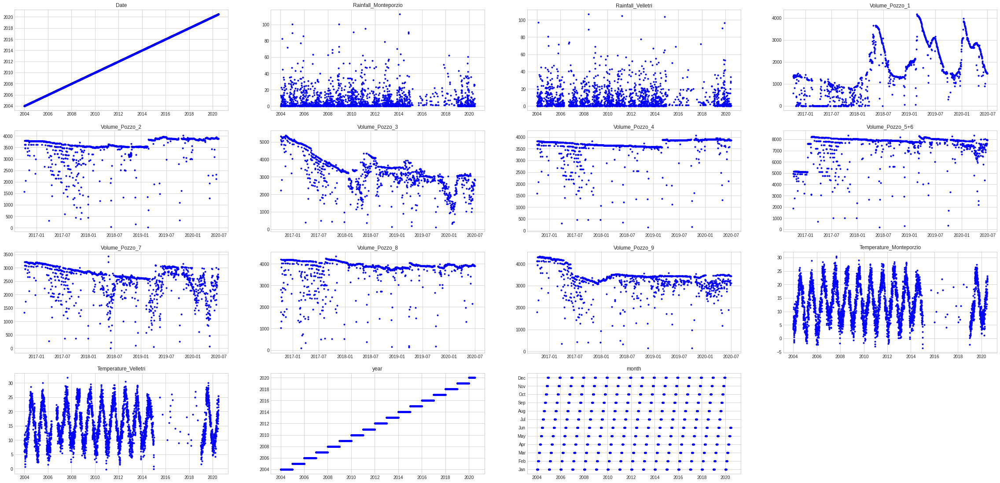

In [ ]:
plt.figure(figsize=(40,60))
i=0
for col in Aquifer_Doganella.columns:
  if col not in Aquifer_Doganella_target:
      plt.subplot(12,4, i+1)
      plt.plot(Aquifer_Doganella.Date,Aquifer_Doganella[col],'b.')
      plt.title(col)
      i=i+1
plt.show()

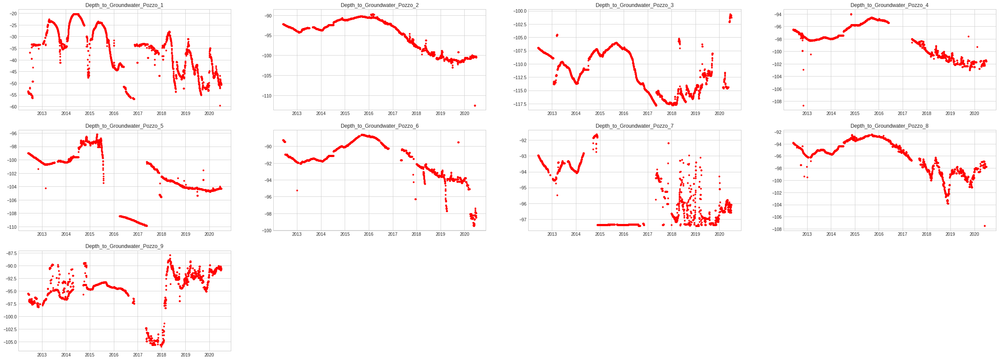

In [ ]:
plt.figure(figsize=(40,60))
for i,col in enumerate(Aquifer_Doganella_target):
  plt.subplot(12,4, i+1)
  plt.plot(Aquifer_Doganella.Date,Aquifer_Doganella[col],'r.')
  plt.title(col)
plt.show()

Dataset Name -  Aquifer_Auser
Target Attributes -  ['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
       Rainfall_Gallicano  ...  Hydrometry_Piaggione
count         5295.000000  ...           6119.000000
mean             4.948782  ...             -0.209204
std             14.366480  ...              0.849013
min              0.000000  ...             -1.190000
25%              0.000000  ...             -1.000000
50%              0.000000  ...             -0.280000
75%              2.000000  ...              0.580000
max            318.800000  ...              3.690000

[8 rows x 26 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8154 entries, 0 to 8153
Data columns (total 27 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     8154 non-null   datetime64[ns]
 1   Rainfall_Gallicano   

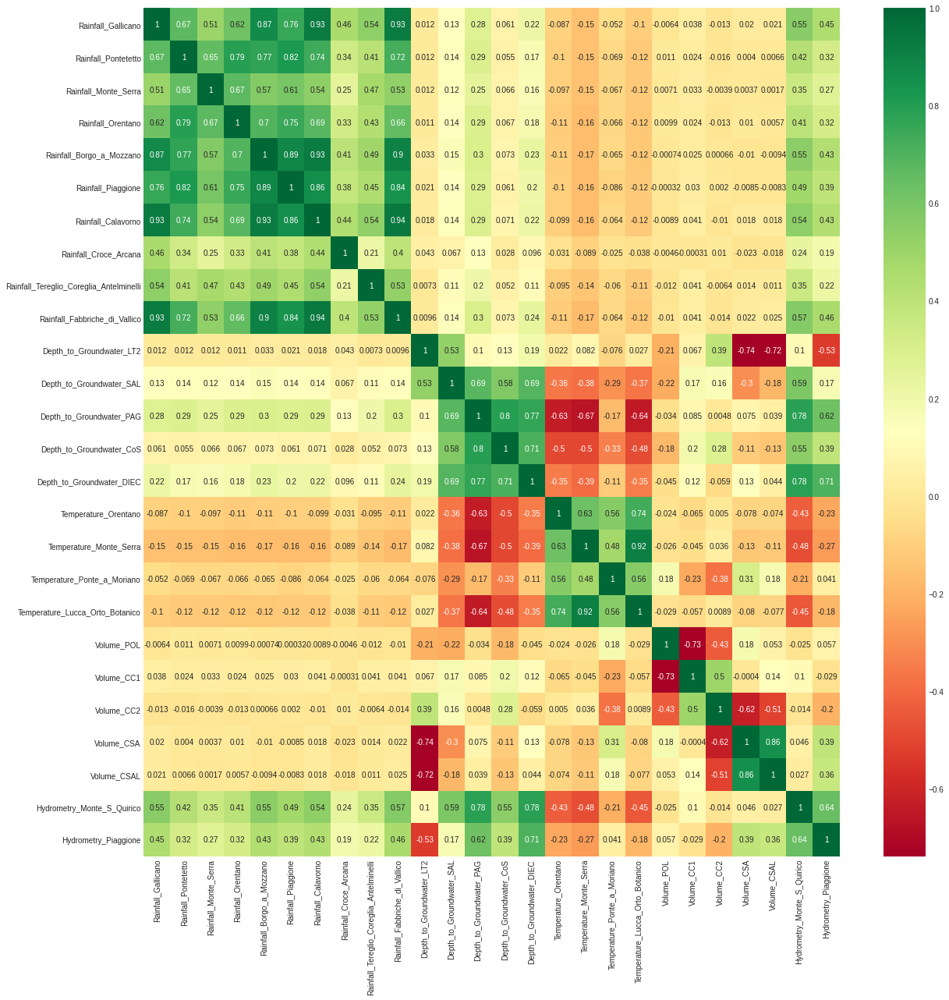

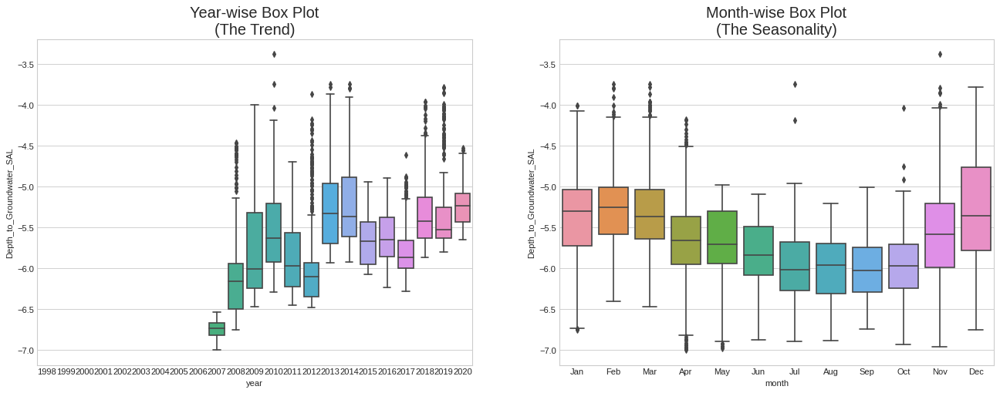

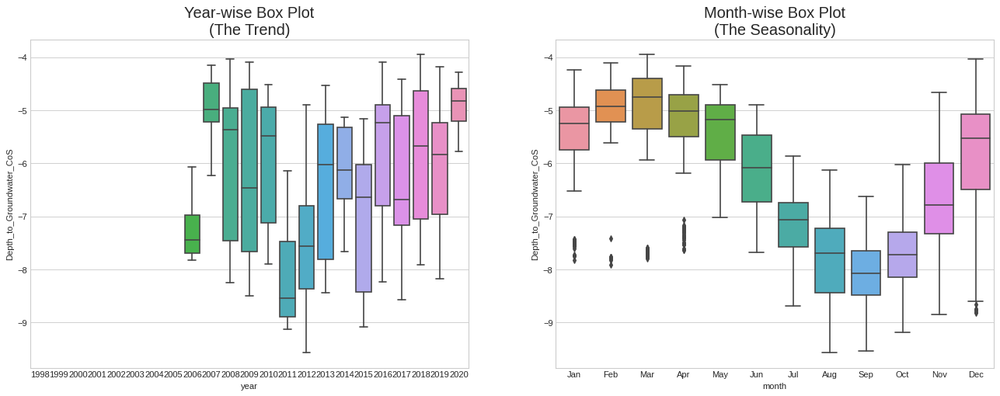

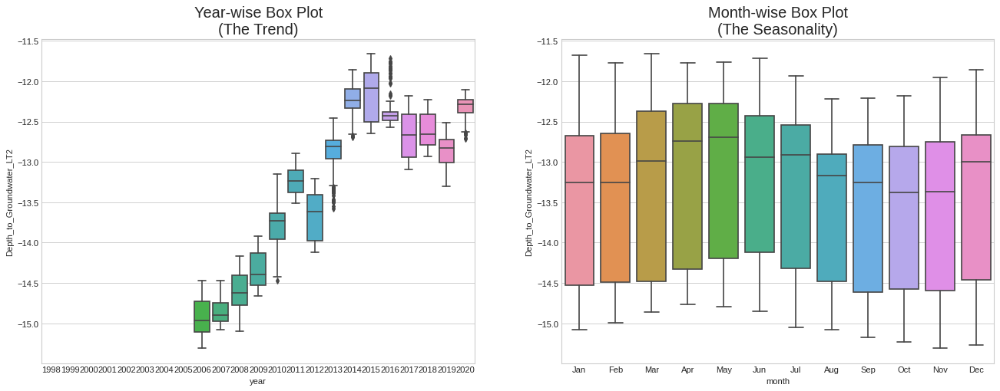

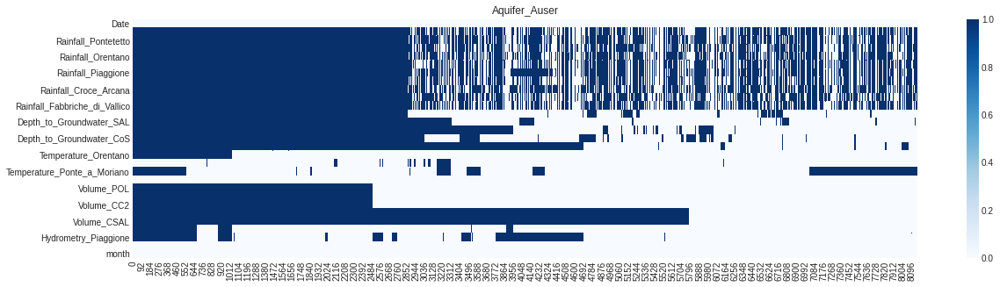

Dataset Name -  Aquifer_Doganella
Target Attributes -  ['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2', 'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4', 'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6', 'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8', 'Depth_to_Groundwater_Pozzo_9']
       Rainfall_Gallicano  ...         year
count         2085.000000  ...  8154.000000
mean            12.567770  ...  2008.837503
std             20.700458  ...     6.453598
min              0.200000  ...  1998.000000
25%              0.800000  ...  2003.000000
50%              4.400000  ...  2009.000000
75%             16.000000  ...  2014.000000
max            318.800000  ...  2020.000000

[8 rows x 27 columns]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8154 entries, 0 to 8153
Data columns (total 29 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   -------

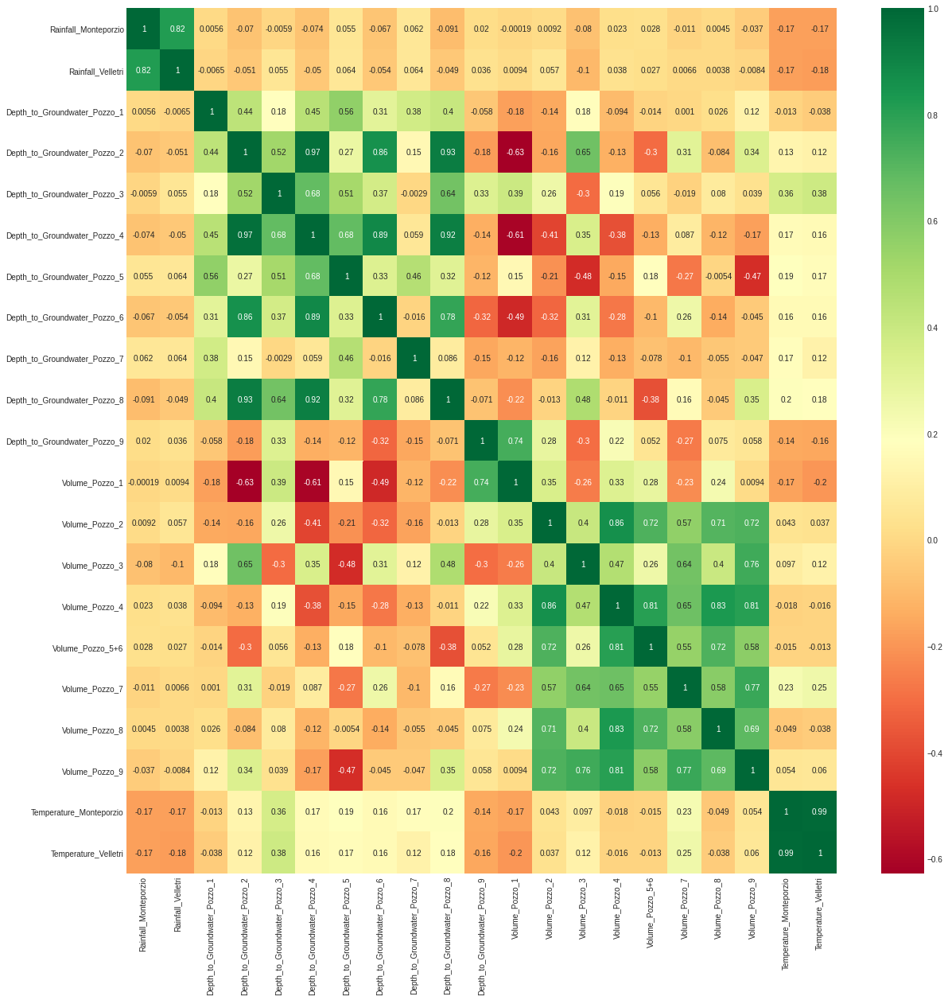

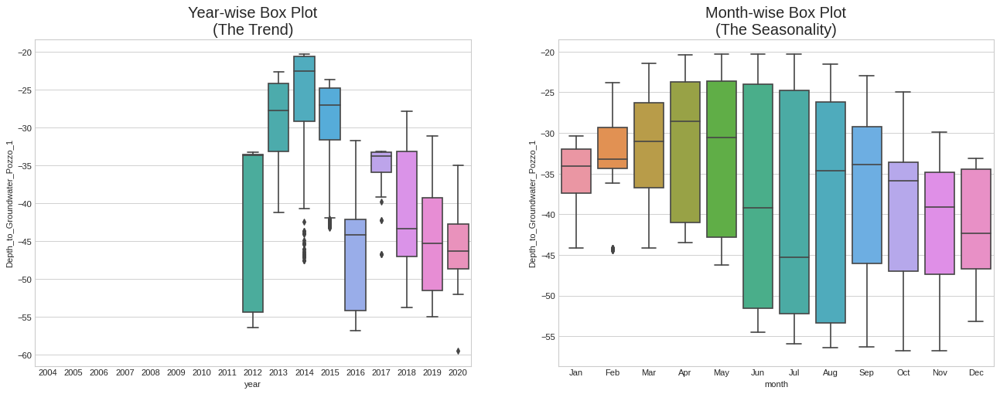

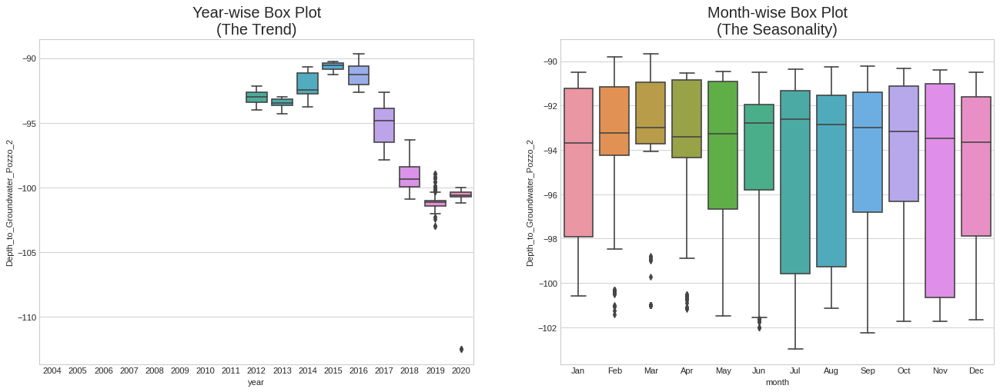

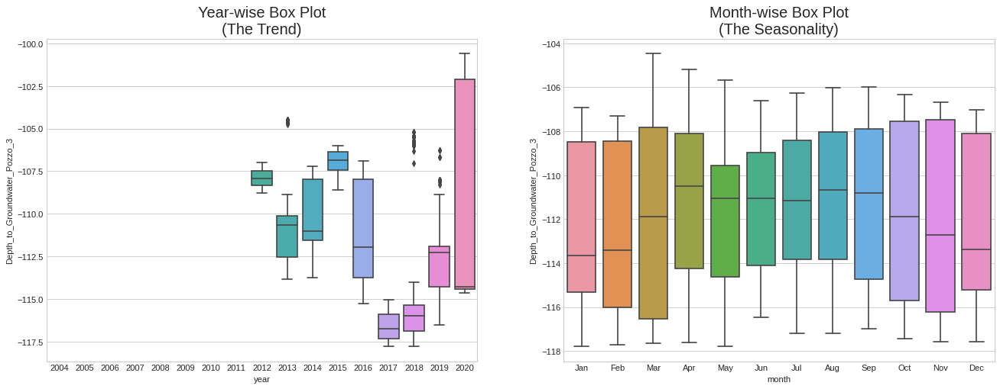

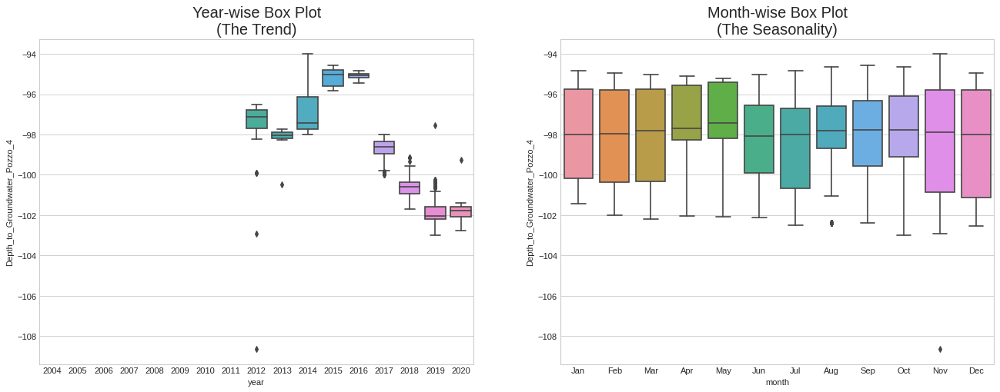

...

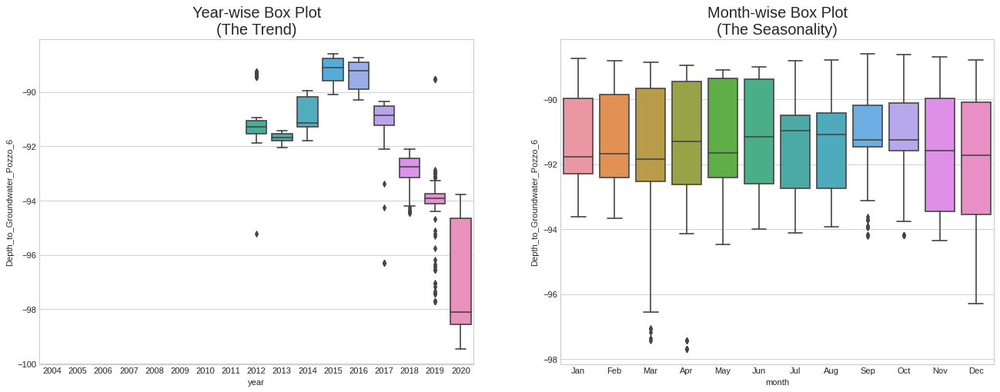

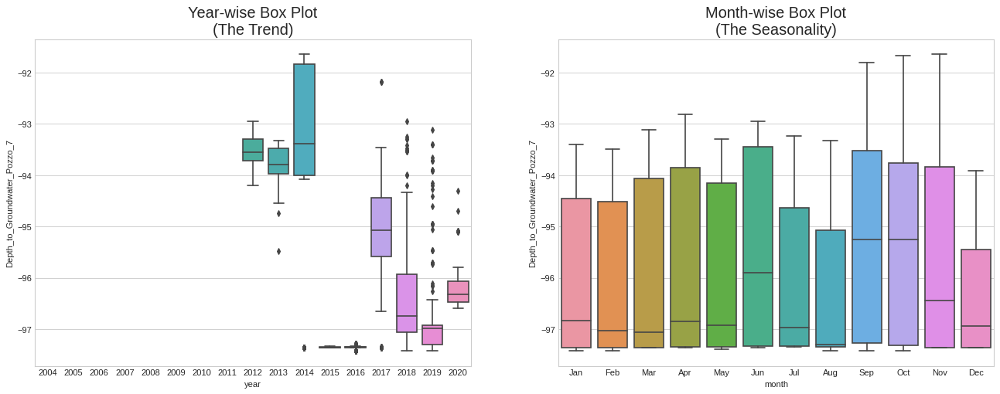

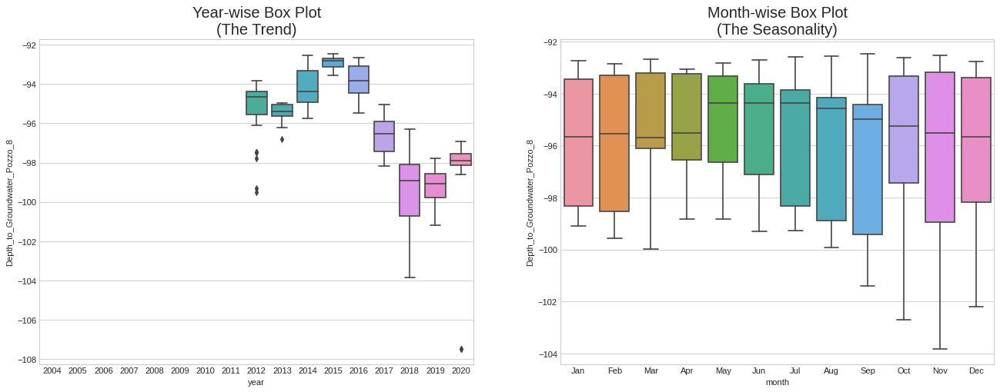

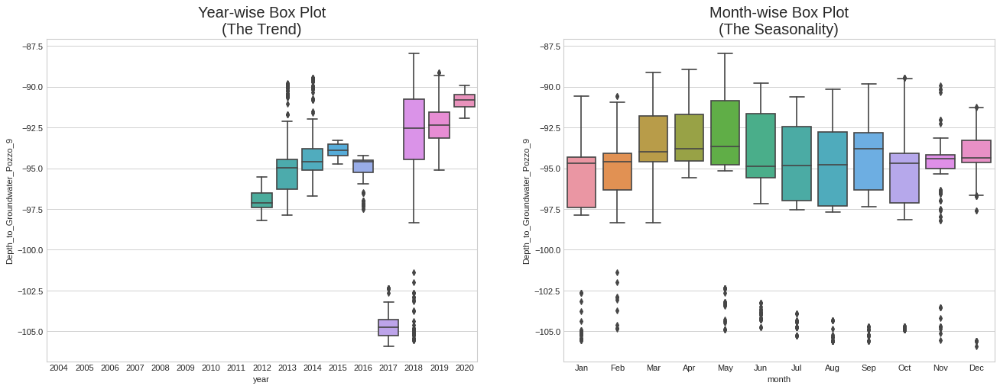

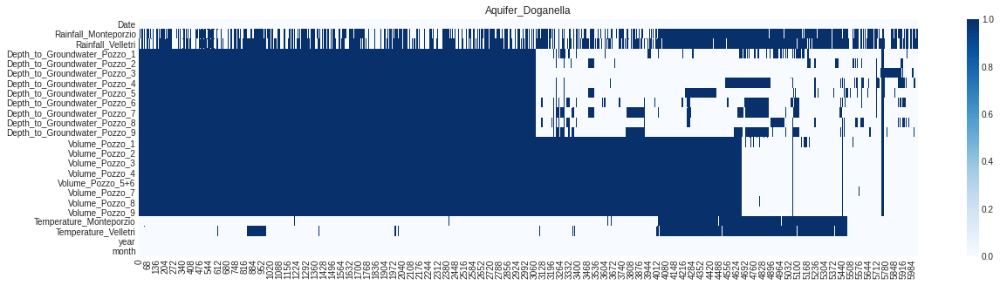

Dataset Name -  Aquifer_Luco
Target Attributes -  ['Depth_to_Groundwater_Podere_Casetta']
       Rainfall_Gallicano  ...         year
count         2085.000000  ...  8154.000000
mean            12.567770  ...  2008.837503
std             20.700458  ...     6.453598
min              0.200000  ...  1998.000000
25%              0.800000  ...  2003.000000
50%              4.400000  ...  2009.000000
75%             16.000000  ...  2014.000000
max            318.800000  ...  2020.000000

[8 rows x 27 columns]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8154 entries, 0 to 8153
Data columns (total 29 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     8154 non-null   datetime64[ns]
 1   Rainfall_Gallicano                       2085 non-null   float64       
 2   Rainfall_Pontetetto                      1945 non-null   float64       

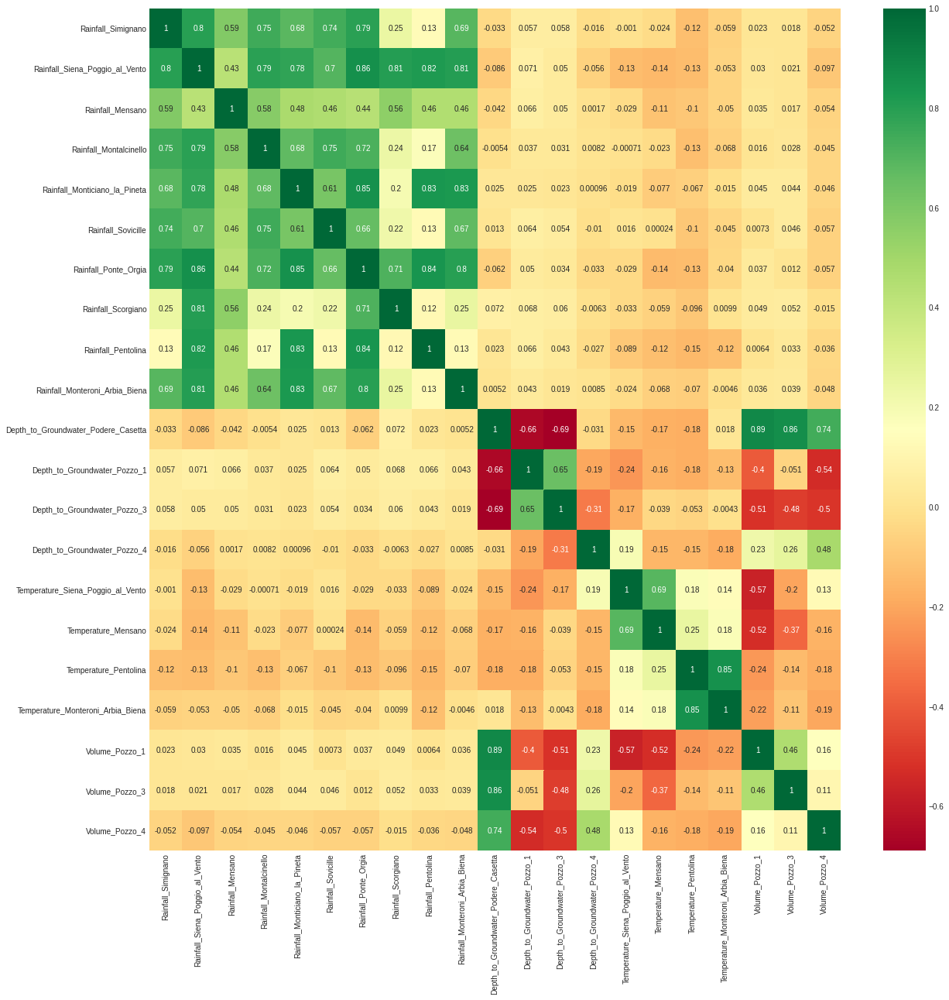

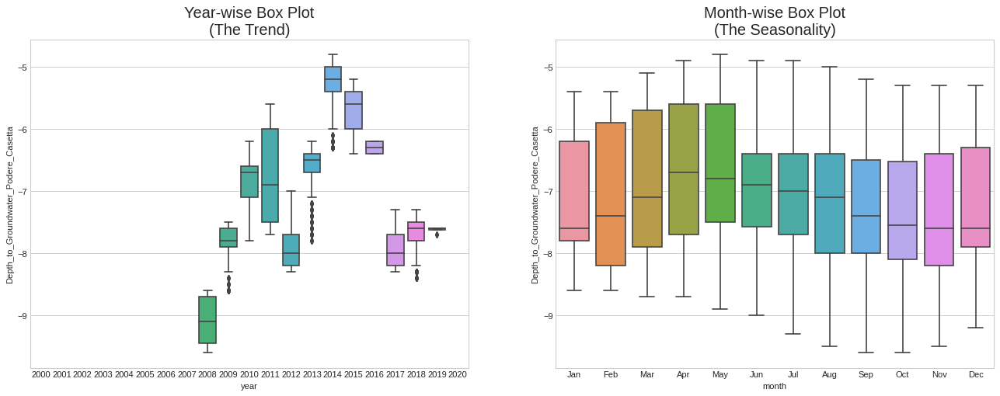

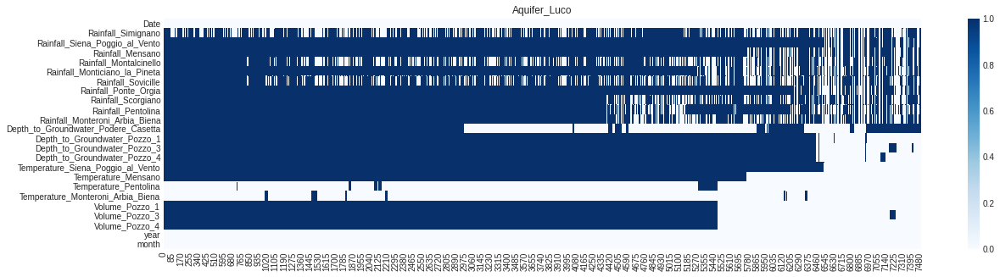

Dataset Name -  Aquifer_Petrignano
Target Attributes -  ['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
       Rainfall_Gallicano  ...         year
count         2085.000000  ...  8154.000000
mean            12.567770  ...  2008.837503
std             20.700458  ...     6.453598
min              0.200000  ...  1998.000000
25%              0.800000  ...  2003.000000
50%              4.400000  ...  2009.000000
75%             16.000000  ...  2014.000000
max            318.800000  ...  2020.000000

[8 rows x 27 columns]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8154 entries, 0 to 8153
Data columns (total 29 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     8154 non-null   datetime64[ns]
 1   Rainfall_Gallicano                       2085 non-null   float64       
 2   Rainfall_Pontetetto                      1945 no

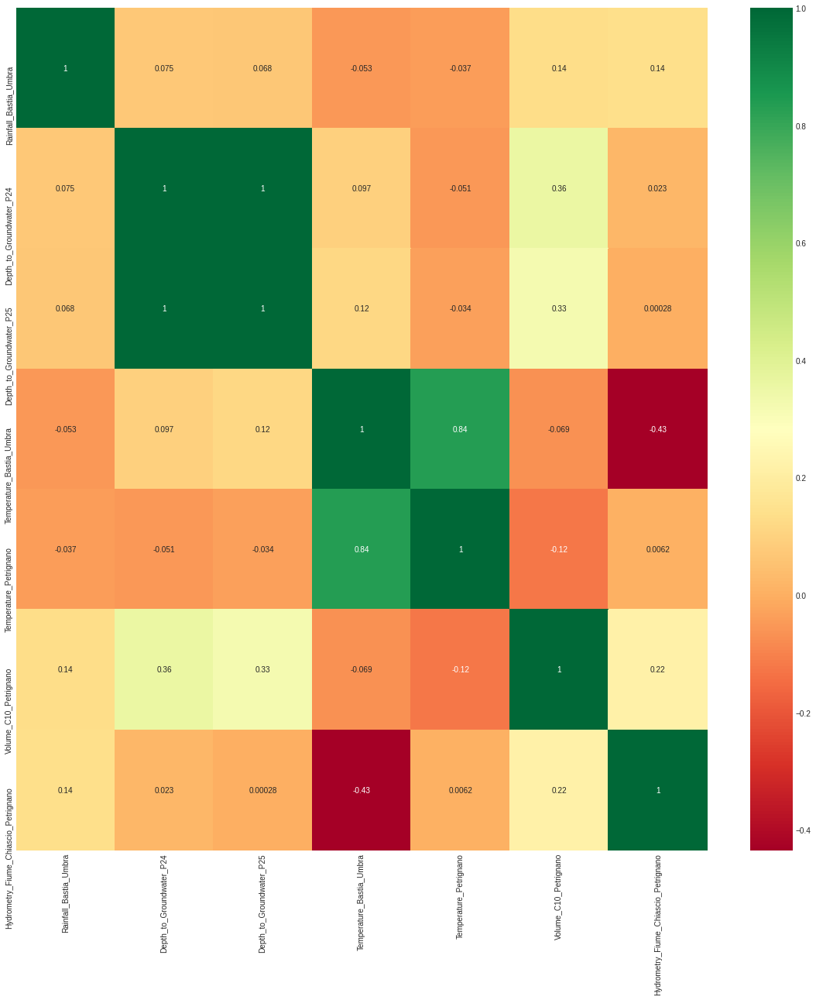

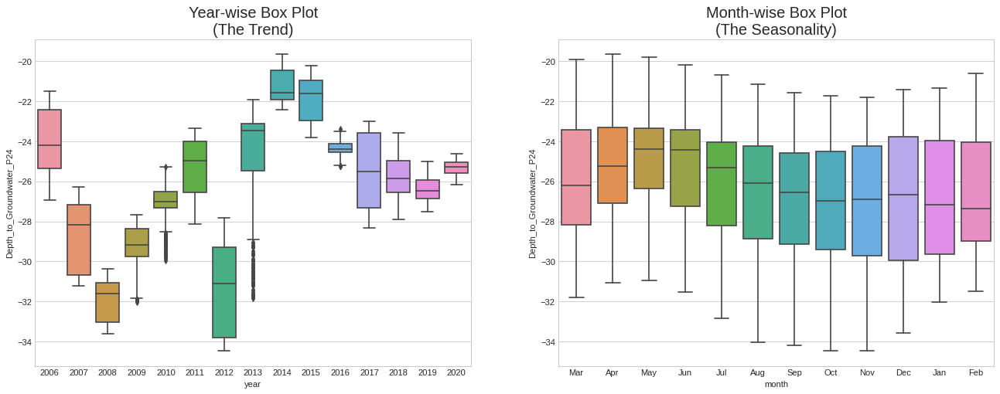

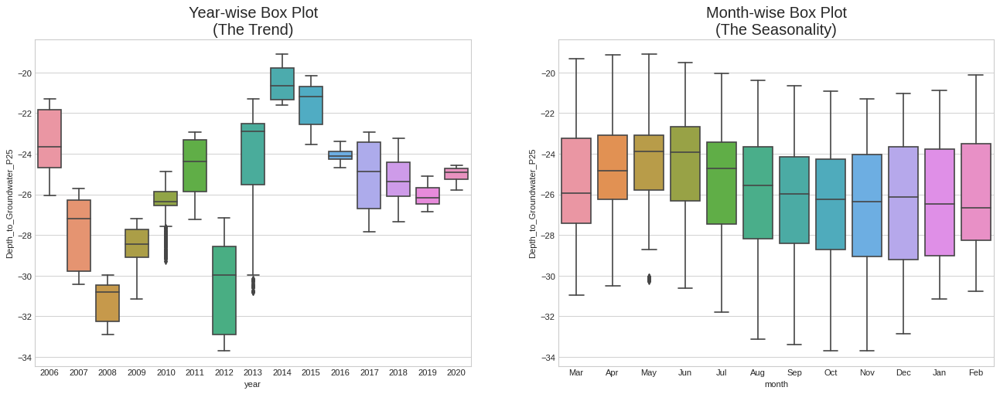

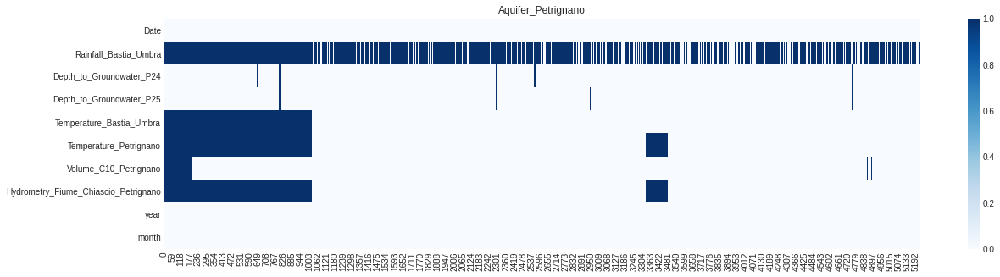

In [ ]:
for i in range(0,4):
  print("Dataset Name - ",dataset[i])
  print("Target Attributes - ",all_data_target[i])
  print(all_data[0].describe())
  print(all_data[0].info())
  
  #Correlation Matric
  corrmat = all_data[i].corr()
  top_corr_features = corrmat.index
  plt.figure(figsize=(20,20))

  #plot heat map
  g=sns.heatmap(all_data[i][top_corr_features].corr(),annot=True,cmap="RdYlGn")
  plt.plot()

  #Box plot for Dependent Attributes
  all_data[i] = box_plot(all_data[i],all_data_target[i])
  plt.show()

  ## Null Values
  nagraph(dataset[i],all_data[i])

#### Lake Waterbody

Bilancino lake is an artificial lake located in the municipality of Barberino di Mugello (about 50 km from Florence). It is used to refill the Arno river during the summer months. Indeed, during the winter months, the lake is filled up and then, during the summer months, the water of the lake is poured into the Arno river.

In [ ]:
#print lake data

The dataset is composed of time series from from 03/06/2002 to 30/06/2020 month by month :

5 Rainfall variables ;
Temperature variables ;
Lake Level (target) ;
Flow Rate (target).
We can see many NaN values at the beginning of the dataset for variables.

Lets have a look at statistical data for better understanding of data.


Dataset Name -  Lake_Bilancino
Target Attributes -  ['Lake_Level', 'Flow_Rate']
       Rainfall_Gallicano  ...         year
count         2085.000000  ...  8154.000000
mean            12.567770  ...  2008.837503
std             20.700458  ...     6.453598
min              0.200000  ...  1998.000000
25%              0.800000  ...  2003.000000
50%              4.400000  ...  2009.000000
75%             16.000000  ...  2014.000000
max            318.800000  ...  2020.000000

[8 rows x 27 columns]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8154 entries, 0 to 8153
Data columns (total 29 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     8154 non-null   datetime64[ns]
 1   Rainfall_Gallicano                       2085 non-null   float64       
 2   Rainfall_Pontetetto                      1945 non-null   float64       
 3   Rain

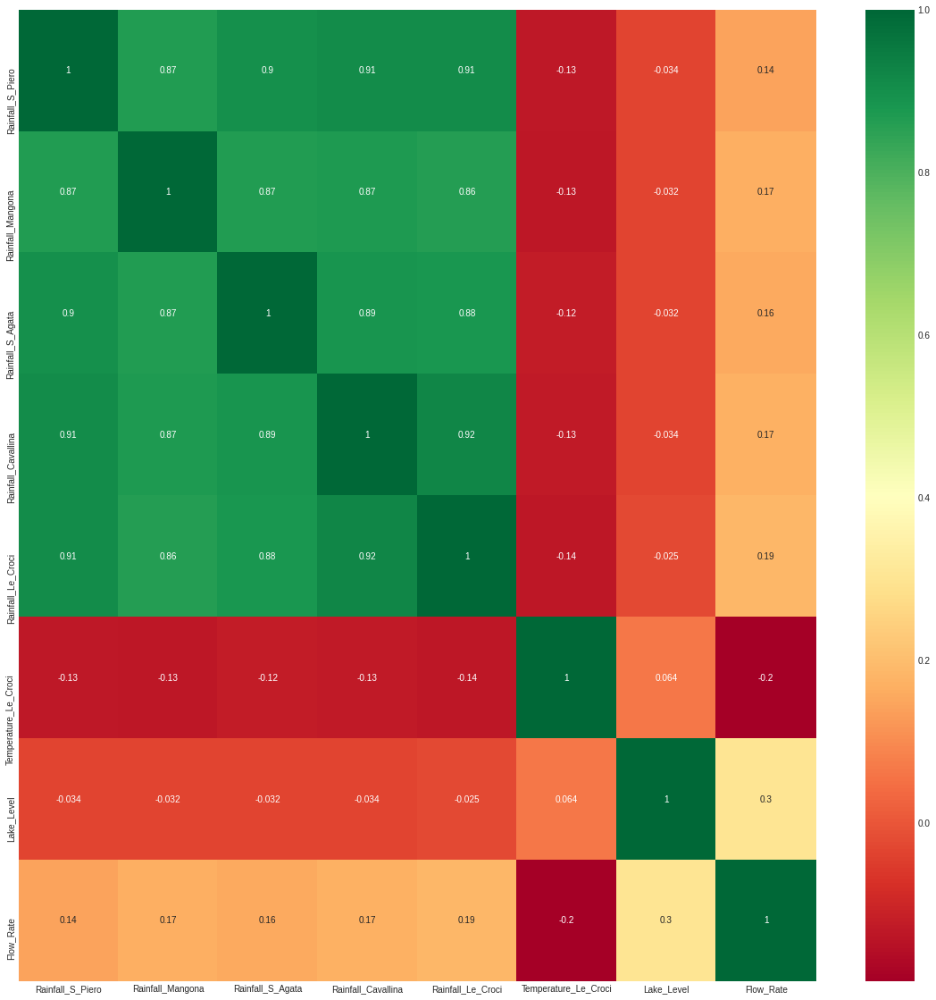

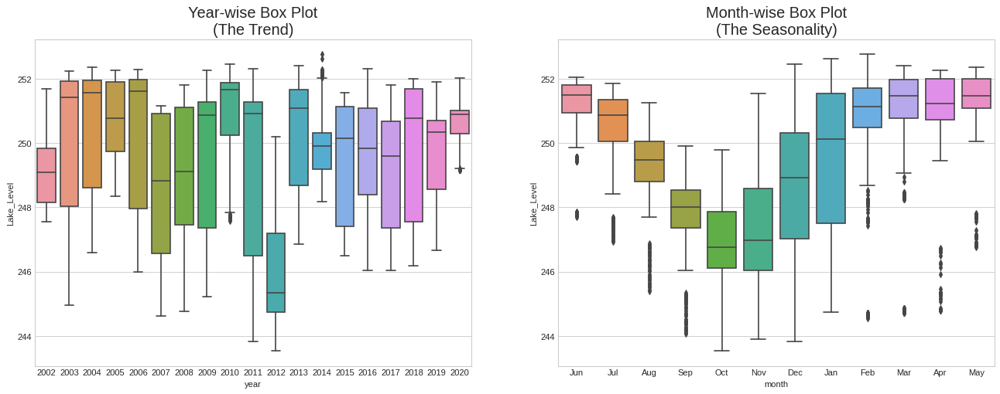

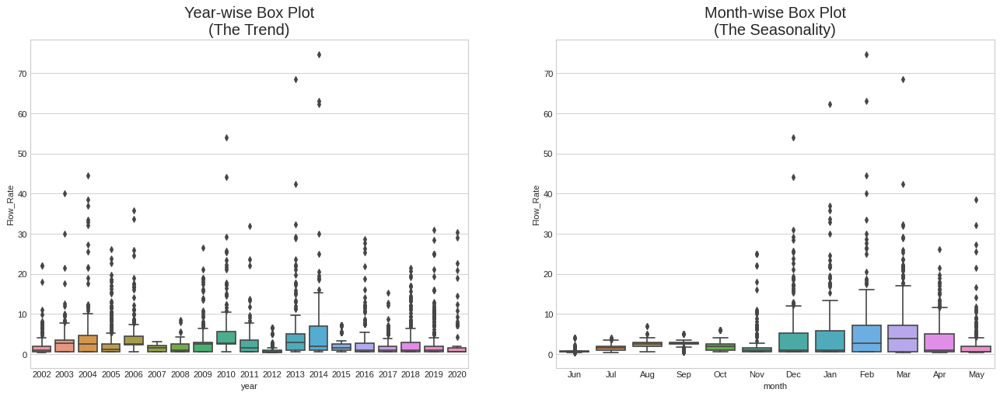

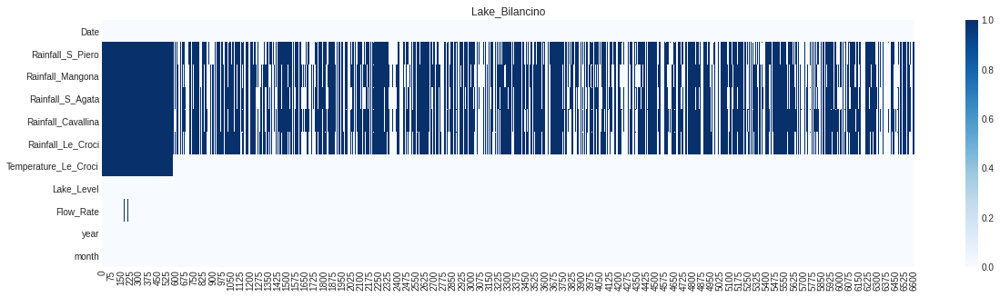

In [ ]:
for i in range(4,5):
  print("Dataset Name - ",dataset[i])
  print("Target Attributes - ",all_data_target[i])
  print(all_data[0].describe())
  print(all_data[0].info())
  
  corrmat = all_data[i].corr()
  top_corr_features = corrmat.index
  plt.figure(figsize=(20,20))
  #plot heat map
  g=sns.heatmap(all_data[i][top_corr_features].corr(),annot=True,cmap="RdYlGn")
  plt.plot()
  all_data[i] = box_plot(all_data[i],all_data_target[i])
  plt.show()
  nagraph(dataset[i],all_data[i])

#### River Waterbody

Dataset Name -  River_Arno
Target Attributes -  ['Hydrometry_Nave_di_Rosano']
       Rainfall_Gallicano  ...         year
count         2085.000000  ...  8154.000000
mean            12.567770  ...  2008.837503
std             20.700458  ...     6.453598
min              0.200000  ...  1998.000000
25%              0.800000  ...  2003.000000
50%              4.400000  ...  2009.000000
75%             16.000000  ...  2014.000000
max            318.800000  ...  2020.000000

[8 rows x 27 columns]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8154 entries, 0 to 8153
Data columns (total 29 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     8154 non-null   datetime64[ns]
 1   Rainfall_Gallicano                       2085 non-null   float64       
 2   Rainfall_Pontetetto                      1945 non-null   float64       
 3   Rainfa

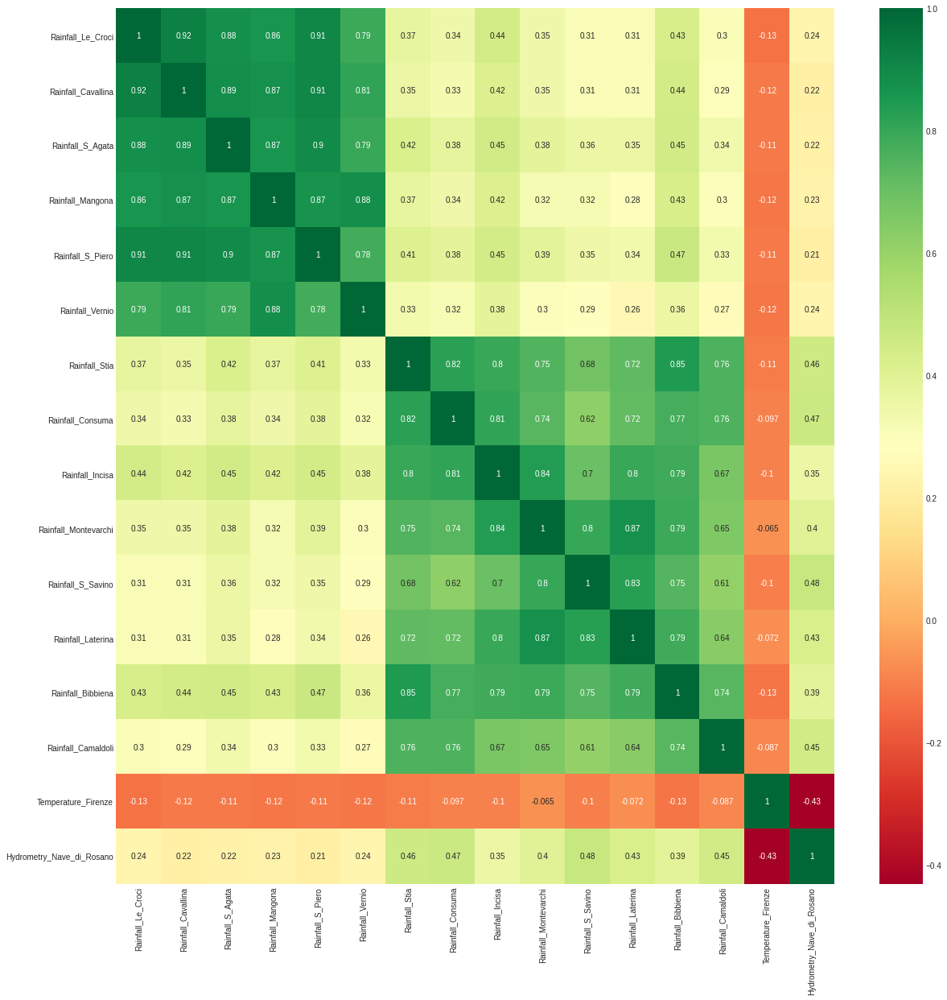

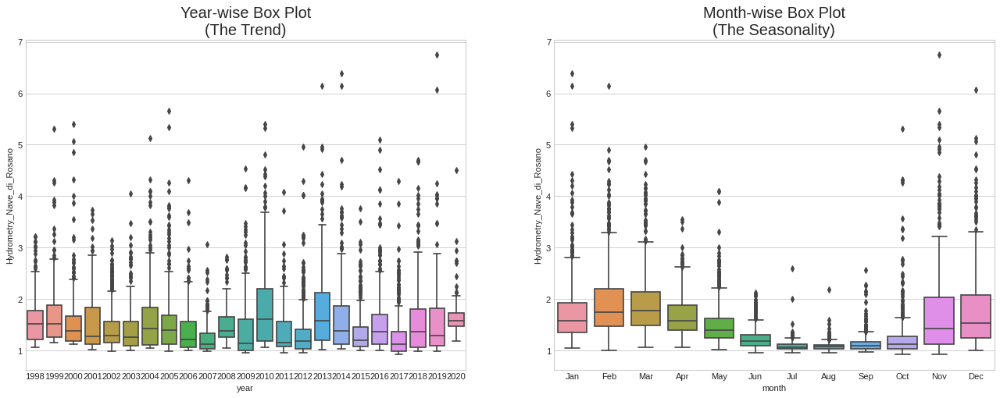

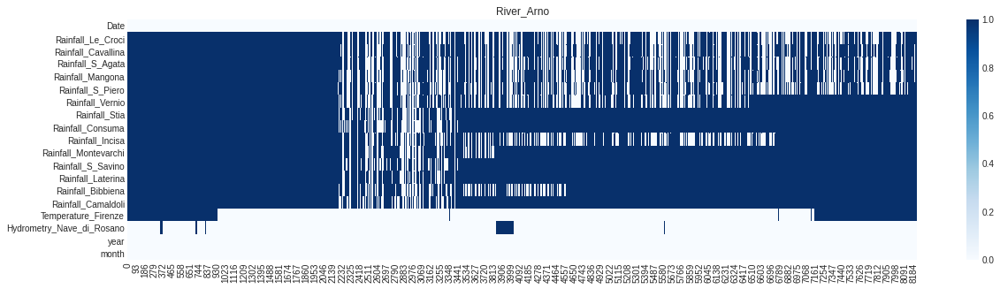

In [ ]:
for i in range(5,6):
  print("Dataset Name - ",dataset[i])
  print("Target Attributes - ",all_data_target[i])
  print(all_data[0].describe())
  print(all_data[0].info())
  
  corrmat = all_data[i].corr()
  top_corr_features = corrmat.index
  plt.figure(figsize=(20,20))
  #plot heat map
  g=sns.heatmap(all_data[i][top_corr_features].corr(),annot=True,cmap="RdYlGn")
  plt.plot()
  all_data[i] = box_plot(all_data[i],all_data_target[i])
  plt.show()
  nagraph(dataset[i],all_data[i])

#### Water Spring Waterbody

Dataset Name -  Water_Spring_Amiata
Target Attributes -  ['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
       Rainfall_Gallicano  ...         year
count         2085.000000  ...  8154.000000
mean            12.567770  ...  2008.837503
std             20.700458  ...     6.453598
min              0.200000  ...  1998.000000
25%              0.800000  ...  2003.000000
50%              4.400000  ...  2009.000000
75%             16.000000  ...  2014.000000
max            318.800000  ...  2020.000000

[8 rows x 27 columns]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8154 entries, 0 to 8153
Data columns (total 29 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     8154 non-null   datetime64[ns]
 1   Rainfall_Gallicano                       2085 non-null   float64       
 2   Rainfall_Po

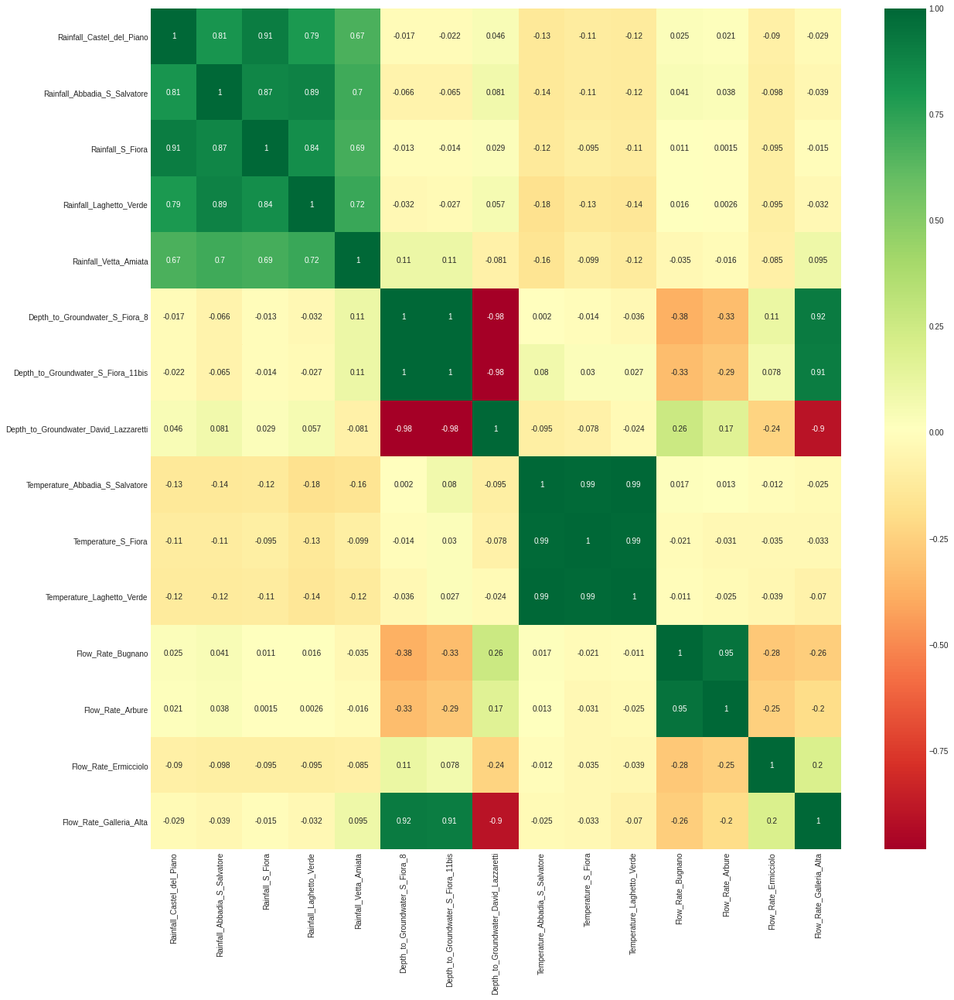

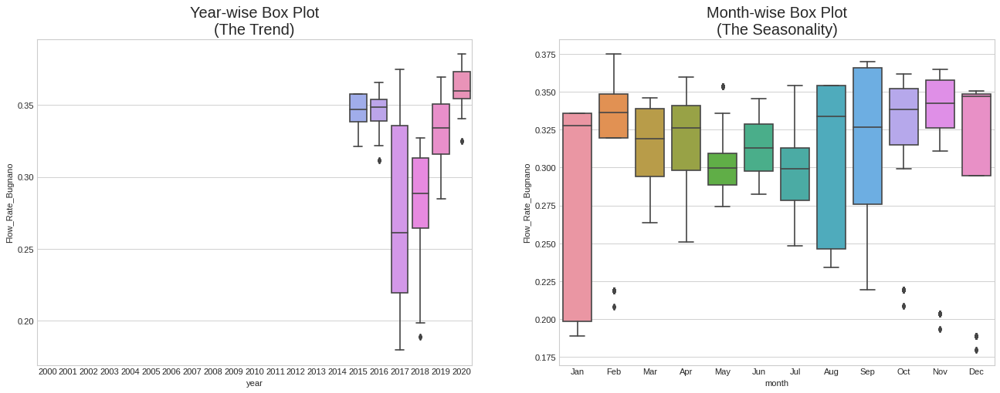

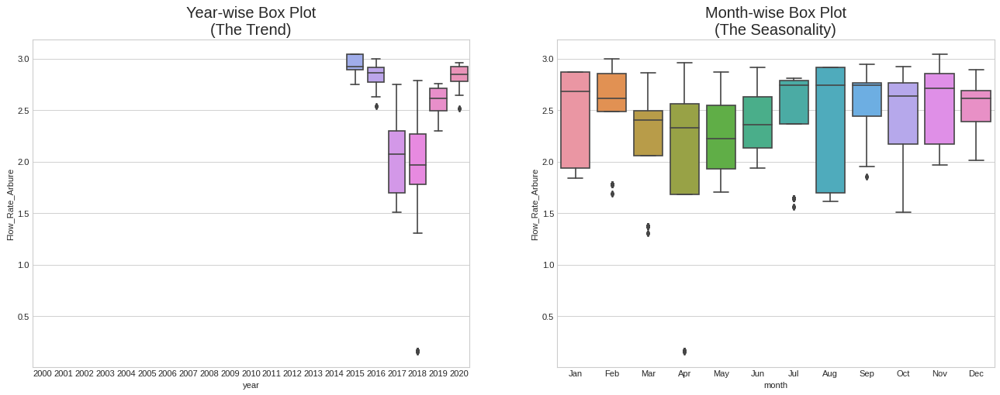

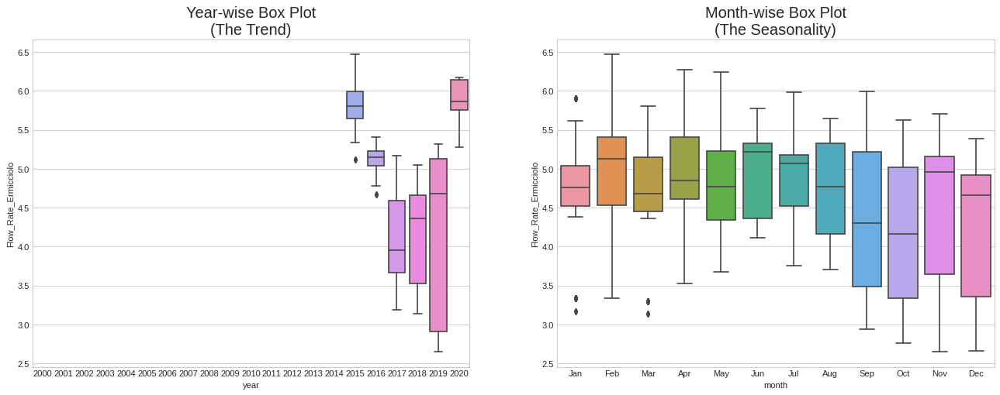

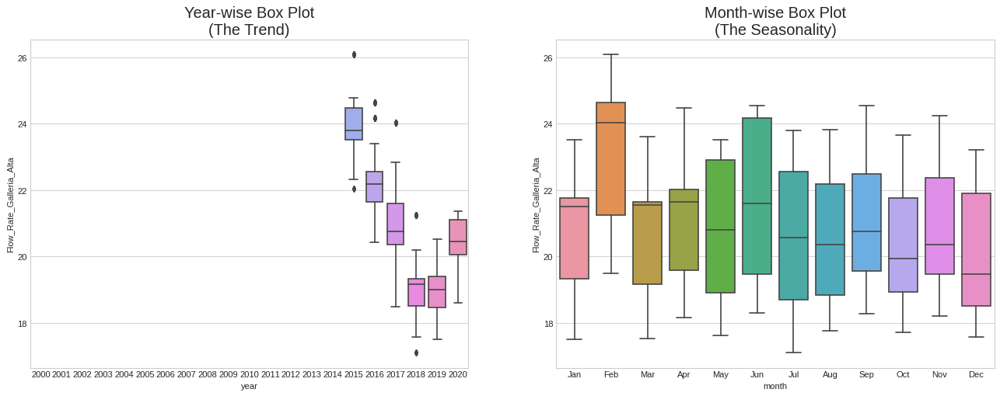

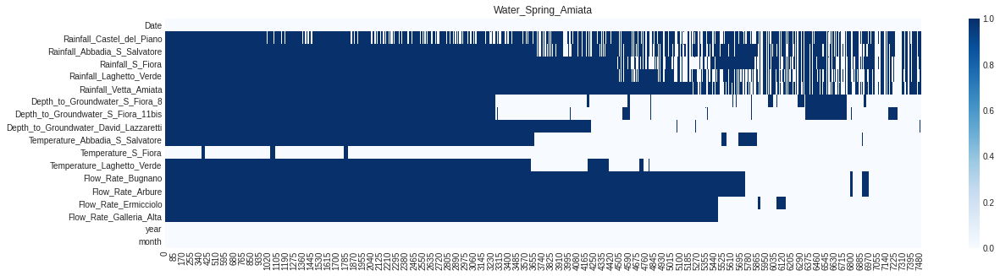

Dataset Name -  Water_Spring_Lupa
Target Attributes -  ['Flow_Rate_Lupa']
       Rainfall_Gallicano  ...         year
count         2085.000000  ...  8154.000000
mean            12.567770  ...  2008.837503
std             20.700458  ...     6.453598
min              0.200000  ...  1998.000000
25%              0.800000  ...  2003.000000
50%              4.400000  ...  2009.000000
75%             16.000000  ...  2014.000000
max            318.800000  ...  2020.000000

[8 rows x 27 columns]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8154 entries, 0 to 8153
Data columns (total 29 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     8154 non-null   datetime64[ns]
 1   Rainfall_Gallicano                       2085 non-null   float64       
 2   Rainfall_Pontetetto                      1945 non-null   float64       
 3   Rainfall_M

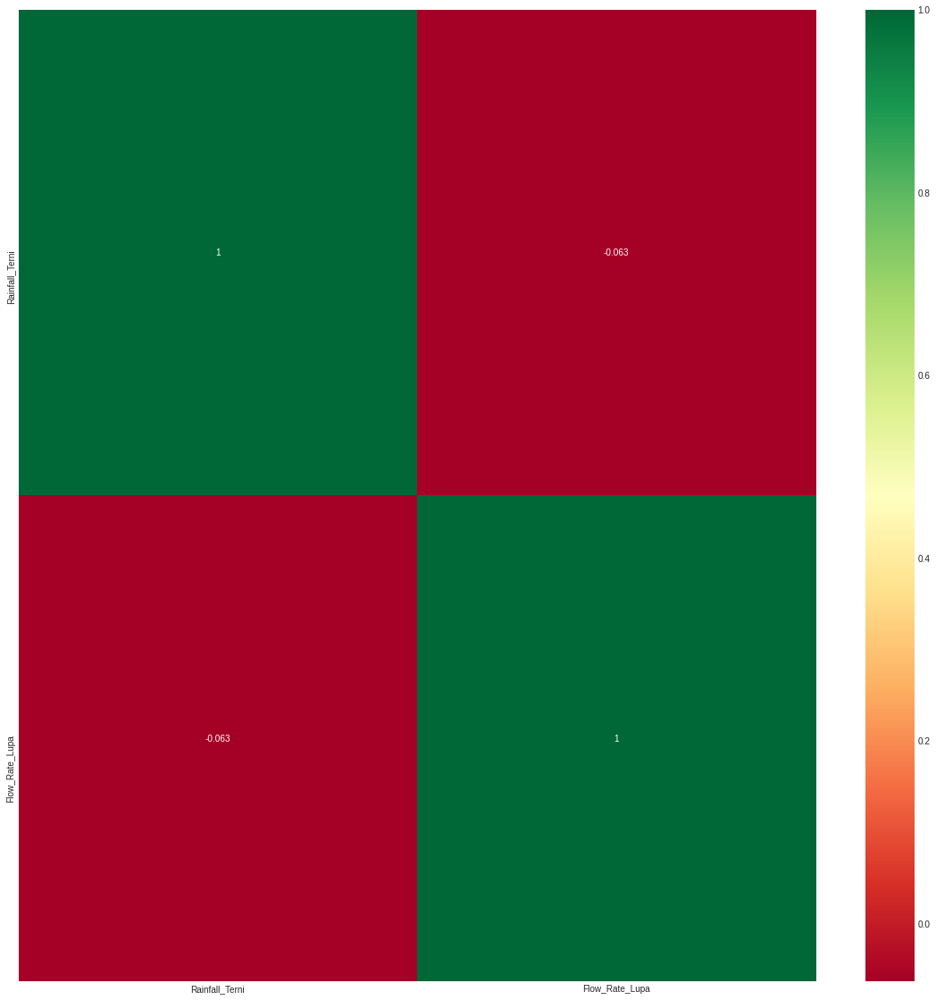

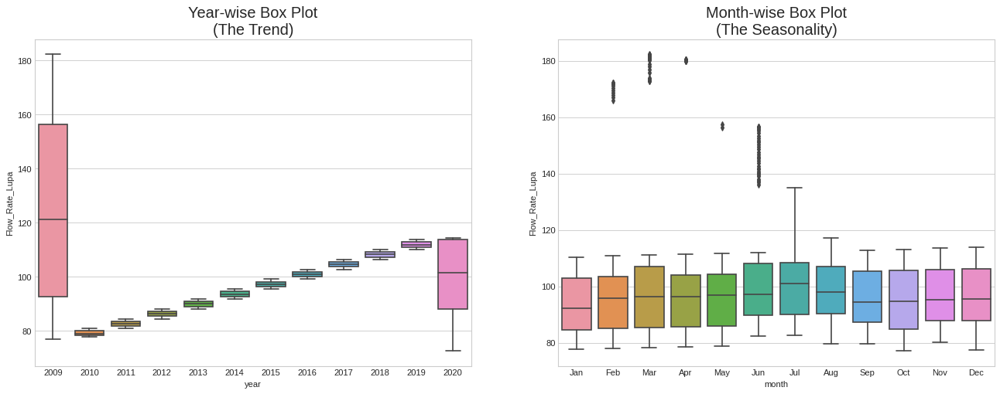

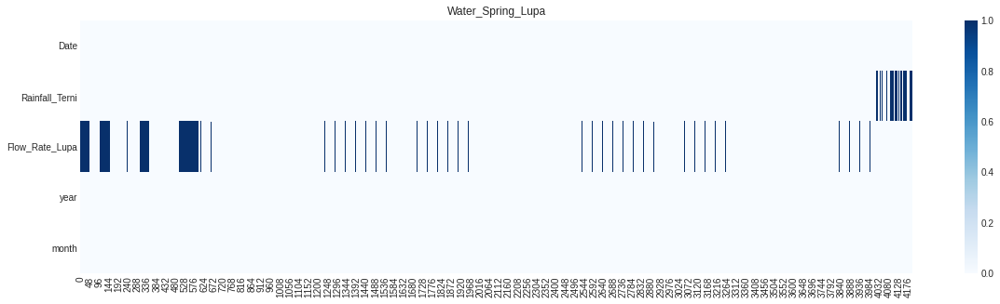

Dataset Name -  Water_Spring_Madonna_di_Canneto
Target Attributes -  ['Flow_Rate_Madonna_di_Canneto']
       Rainfall_Gallicano  ...         year
count         2085.000000  ...  8154.000000
mean            12.567770  ...  2008.837503
std             20.700458  ...     6.453598
min              0.200000  ...  1998.000000
25%              0.800000  ...  2003.000000
50%              4.400000  ...  2009.000000
75%             16.000000  ...  2014.000000
max            318.800000  ...  2020.000000

[8 rows x 27 columns]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8154 entries, 0 to 8153
Data columns (total 29 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Date                                     8154 non-null   datetime64[ns]
 1   Rainfall_Gallicano                       2085 non-null   float64       
 2   Rainfall_Pontetetto                      1945 non-null   fl

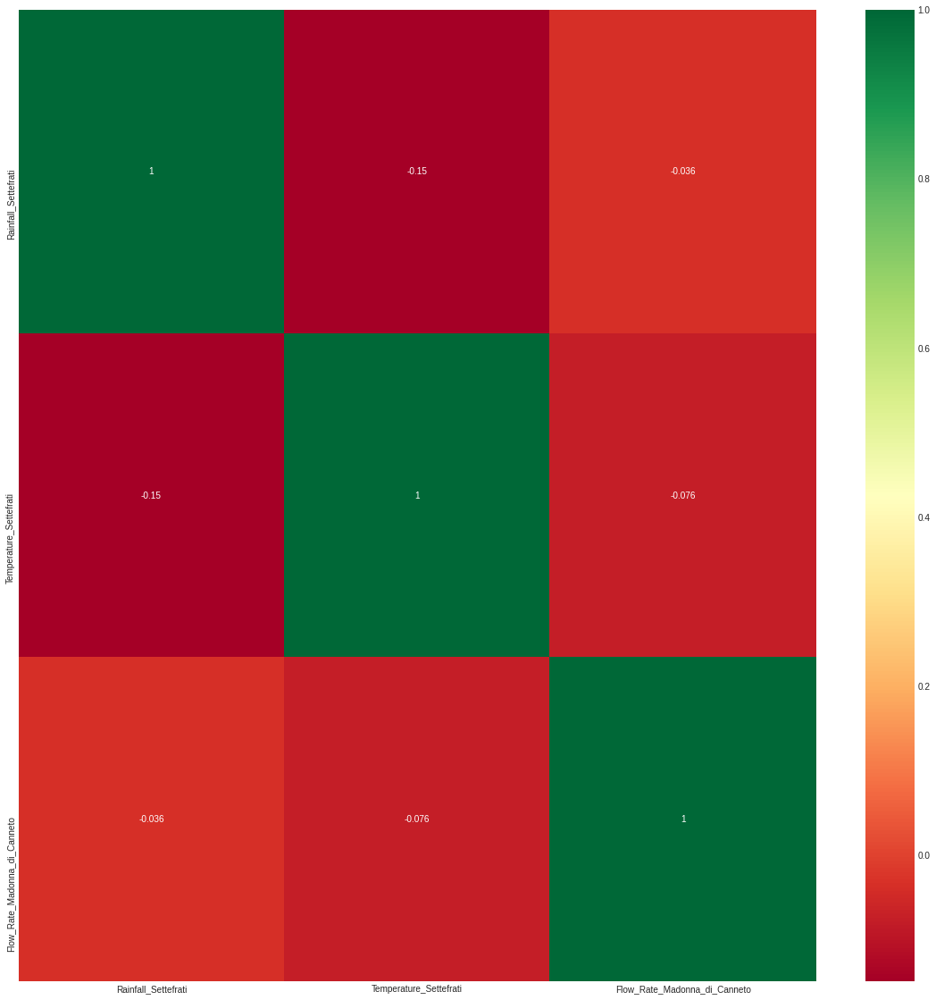

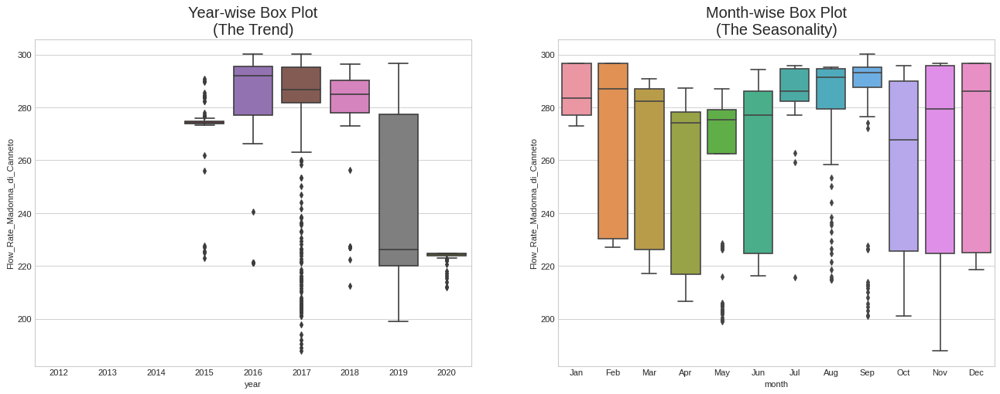

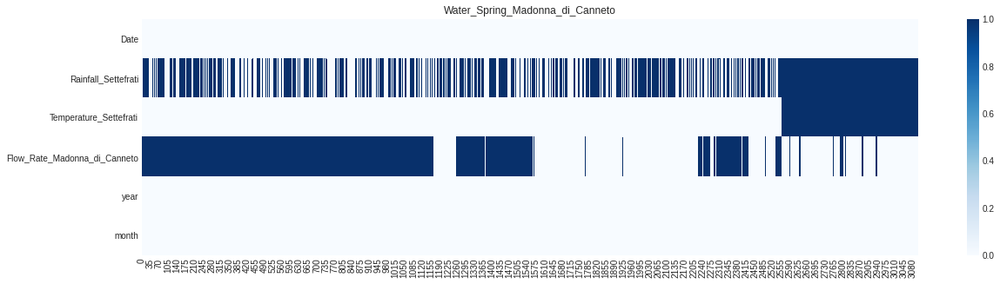

In [ ]:
for i in range(6,9):
  print("Dataset Name - ",dataset[i])
  print("Target Attributes - ",all_data_target[i])
  print(all_data[0].describe())
  print(all_data[0].info())
  
  corrmat = all_data[i].corr()
  top_corr_features = corrmat.index
  plt.figure(figsize=(20,20))
  #plot heat map
  g=sns.heatmap(all_data[i][top_corr_features].corr(),annot=True,cmap="RdYlGn")
  plt.plot()
  all_data[i] = box_plot(all_data[i],all_data_target[i])
  plt.show()
  nagraph(dataset[i],all_data[i])

In [ ]:
year_to_select =  [2011,2017,2017,2009,2004,2004,2016,2011,2017]

# Data Preprocessing

### Feature Selection

As a preprocessing step of the data, we will fill the NaN values and replace the implausible values as well. First, the implausible values of 0°C will be replaced with NaN values. Then all NaN values will be filled by prediction. For this, we will build a small prediction model.

We will be using LightGBM with a 5 fold CV. The features are the temperature columns as well as the date features. Although, the mean absolute error is quite high for the below shown example, we can see that the rolling mean for the predicted values is very close to the rolling mean of the ground truth. Although the models performance is not very good, we can evaluate it as sufficient for filling the missing values.

Select datasets values based on target attribute null values

In [ ]:
def select_dates(acea_df,year):
    acea_df['year'] = pd.DatetimeIndex(acea_df['Date']).year 
    acea_df = acea_df[acea_df.year>year-1]
    acea_df.replace(0, np.nan,inplace=True) 
    return acea_df

for i,(acea_df,year) in enumerate(zip(all_data,year_to_select)):
  all_data[i] = select_dates(acea_df,year)

###Null Values handling

We are dropping columns from all datasets having more than 20 percent null values.
Also we are dropping multiple columns for aquifer_auser, aquifer_dogenella and Water_Spring_Amiata because as we observed above in correlation matrix these columns have no effect on target values. 

In [ ]:
all_data[0].drop(['Volume_POL','Volume_CC1'],axis=1,inplace=True)
all_data[1].drop(['Volume_Pozzo_1'],axis=1,inplace=True)
all_data[6].drop(['Temperature_Abbadia_S_Salvatore','Temperature_S_Fiora','Temperature_Laghetto_Verde'],axis=1,inplace=True)

In [ ]:
all_data[6].isnull().mean()

Date                                     0.000000
Rainfall_Castel_del_Piano                0.686549
Rainfall_Abbadia_S_Salvatore             0.649422
Rainfall_S_Fiora                         0.608643
Rainfall_Laghetto_Verde                  0.544735
Rainfall_Vetta_Amiata                    0.566038
Depth_to_Groundwater_S_Fiora_8           0.348752
Depth_to_Groundwater_S_Fiora_11bis       0.311016
Depth_to_Groundwater_David_Lazzaretti    0.007304
Flow_Rate_Bugnano                        0.056604
Flow_Rate_Arbure                         0.056604
Flow_Rate_Ermicciolo                     0.073646
Flow_Rate_Galleria_Alta                  0.000000
year                                     0.000000
month                                    0.000000
dtype: float64

Removing Independent Attributes consisting of Null values more than 20% after year selection

In [ ]:
for i in range(len(all_data)):
  for cols in all_data[i].columns:
    if cols not in all_data_target[i] and all_data[i][cols].isnull().mean() > 0.2:
        all_data[i].drop([cols],axis=1,inplace=True)
  print(all_data[i].columns)

Index(['Date', 'Depth_to_Groundwater_LT2', 'Depth_to_Groundwater_SAL',
       'Depth_to_Groundwater_PAG', 'Depth_to_Groundwater_CoS',
       'Depth_to_Groundwater_DIEC', 'Temperature_Orentano',
       'Temperature_Monte_Serra', 'Temperature_Lucca_Orto_Botanico',
       'Volume_CC2', 'Hydrometry_Monte_S_Quirico', 'Hydrometry_Piaggione',
       'year', 'month'],
      dtype='object')
Index(['Date', 'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2',
       'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4',
       'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6',
       'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8',
       'Depth_to_Groundwater_Pozzo_9', 'Volume_Pozzo_2', 'Volume_Pozzo_3',
       'Volume_Pozzo_4', 'Volume_Pozzo_5+6', 'Volume_Pozzo_7',
       'Volume_Pozzo_8', 'Volume_Pozzo_9', 'year', 'month'],
      dtype='object')
Index(['Date', 'Depth_to_Groundwater_Podere_Casetta', 'Temperature_Mensano',
       'Temperature_Pento

### Null Values imputation using LightGBM

In [ ]:
def data_impute(acea_df,acea_df_target):
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_absolute_error
    import lightgbm as lgb

    features_to_fill = acea_df.columns[:-1]
    temp_df = acea_df[features_to_fill].copy()

    # Create time related features
    temp_df['year'] = pd.DatetimeIndex(temp_df['Date']).year 

    temp_df['month'] = pd.DatetimeIndex(temp_df['Date']).month 
    month_in_year = 12
    temp_df['month_sin'] = np.sin(2*np.pi*temp_df.month/month_in_year)
    temp_df['month_cos'] = np.cos(2*np.pi*temp_df.month/month_in_year)

    temp_df['season'] = temp_df.month%12 // 4 + 1

    temp_df['day_of_year'] = pd.DatetimeIndex(temp_df['Date']).dayofyear
    days_in_year = 365.25
    temp_df['day_of_year_sin'] = np.sin(2*np.pi*temp_df.day_of_year/days_in_year)
    temp_df['day_of_year_cos'] = np.cos(2*np.pi*temp_df.day_of_year/days_in_year)

    temp_df['week_of_year'] = pd.DatetimeIndex(temp_df['Date']).weekofyear
    weeks_in_year = 52.1429
    temp_df['week_of_year_sin'] = np.sin(2*np.pi*temp_df.week_of_year/weeks_in_year)
    temp_df['week_of_year_cos'] = np.cos(2*np.pi*temp_df.week_of_year/weeks_in_year)
    
    features = ['month_sin', 'month_cos', 'day_of_year_sin', 'day_of_year_cos', 'week_of_year_sin', 'week_of_year_cos', 'year', 'season']
    temp_df.drop(['month'],axis=1,inplace=True)
    i=1
    plt.figure(figsize=(60,20))
    for attribute in features_to_fill[1:]:
          if attribute in acea_df_target:
            clr = 'black'
          else:
            clr = 'blue'
          target = attribute
          X = temp_df[temp_df[attribute].notna()][features]#.reset_index(drop=True)
          y = temp_df[temp_df[attribute].notna()][target]#.reset_index(drop=True)
          X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.3)

          X_test = temp_df[features]#.reset_index(drop=True)
          # Model
          params = {'num_leaves': 32,
                    'objective': 'regression_l1',
                    'max_depth': 8,
                    'learning_rate': 0.05,
                    "metric": 'mae',
                    'seed' : 42
                  }

          dtrain = lgb.Dataset(X_train, y_train)
          dvalid = lgb.Dataset(X_valid, y_valid)

          clf = lgb.train(params, dtrain, 5000, valid_sets = [dtrain, dvalid], verbose_eval=False,  early_stopping_rounds=100)

          y_pred_valid = clf.predict(X_valid)
          
          old = temp_df[attribute].copy()
          y_pred = clf.predict(X_test)
          #replacing of actual null values here
          acea_df[attribute] = np.where(acea_df[attribute].isna(), y_pred, acea_df[attribute])
          
          plt.subplot(10,3,i)
          sns.scatterplot(x=acea_df.Date, y=acea_df[attribute], color='red',label='predicted')
          sns.scatterplot(x=acea_df.Date, y=old.fillna(np.inf), color=clr, label = 'original')
          i=i+1
    plt.show()
    return acea_df

In [ ]:
for i,(name,acea_df,acea_df_target) in enumerate(zip(dataset,all_data,all_data_target)):
    print("Dataset for imputation - " + str(name))
    all_data[i] = data_impute(acea_df,acea_df_target)

Remove date and month(dont need them for model)

In [ ]:
for i,(acea_df,year) in enumerate(zip(all_data,year_to_select)):
  try:
        all_data[i].drop(['Date','month'],axis=1,inplace=True)
  except:
        all_data[i].drop(['Date'],axis=1,inplace=True)

##Stationarity test
(Nans and inf not allowed)
more negative the value the more likely we are to reject null hypothesis(stationary)

Using non-stationary time series data in forecasting models produces unreliable and spurious results that leads to poor understanding and forecasting. The solution to the problem is to transform the time series data so that it becomes stationary. ADF and KPSS are quick stationary statistical tests to understand the data you are dealing with.
Most statistical forecasting methods are based on the assumption that the time series are approximately stationary. A stationary series is relatively easy to predict: you simply forecast that its statistical properties will be the same in the future as they have been in the past. Analysis of time series patterns is the first step of converting non-stationary data in to stationary data (for example by trend removal), so that the statistical forecasting methods could be applied. There are three fundamental steps of building a quality forecasting time series model: making the data stationary, selecting the right model, and evaluating model accuracy.

Augmented Dickey-Fuller (ADF) test is a type of statistical test called a unit root test. Unit roots are a cause for non-stationarity.

Null Hypothesis (H0): Time series has a unit root. (Time series is not stationary).

Alternate Hypothesis (H1): Time series has no unit root (Time series is stationary).

If the null hypothesis can be rejected, we can conclude that the time series is stationary.

There are two ways to rejects the null hypothesis:

On the one hand, the null hypothesis can be rejected if the p-value is below a set significance level. The defaults significance level is 5%

**p-value > significance level (default: 0.05)**: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.
**p-value <= significance level (default: 0.05)**: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.
On the other hand, the null hypothesis can be rejects if the test statistic is less than the critical value.

**ADF statistic > critical value**: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.
**ADF statistic < critical value**: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.

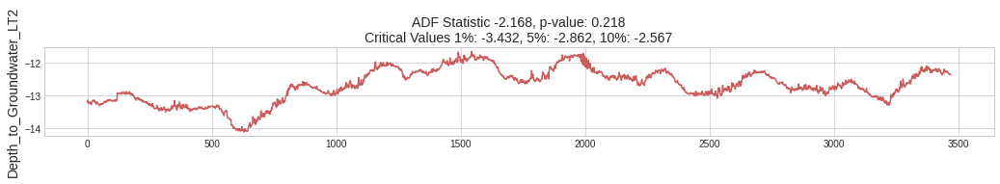

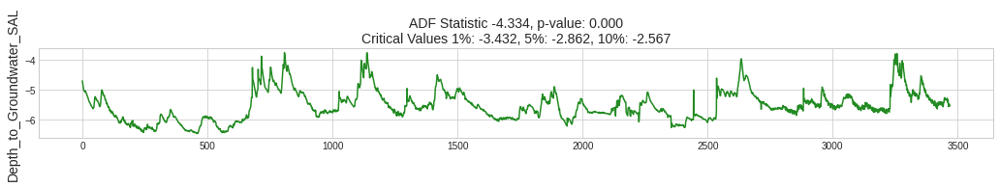

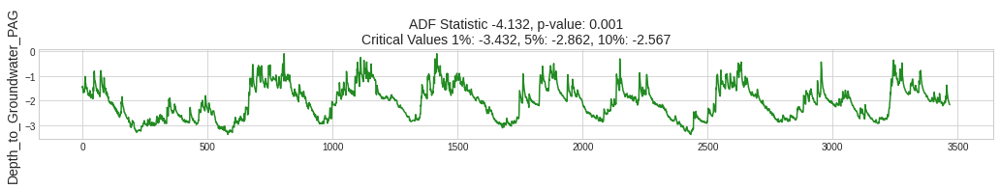

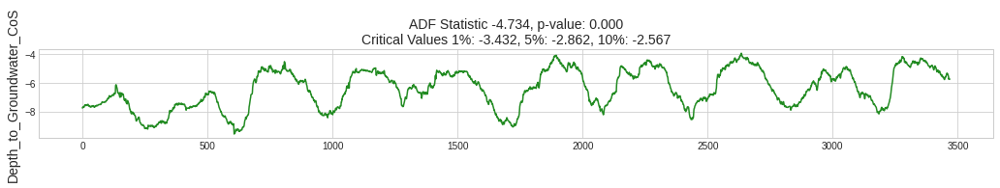

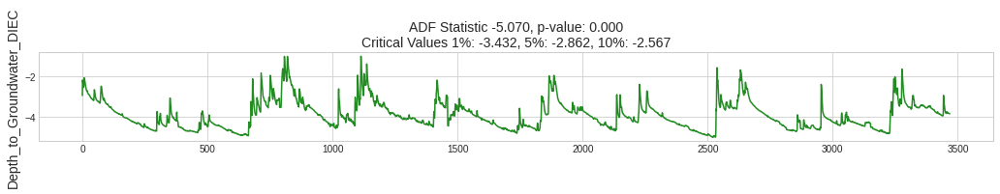

...

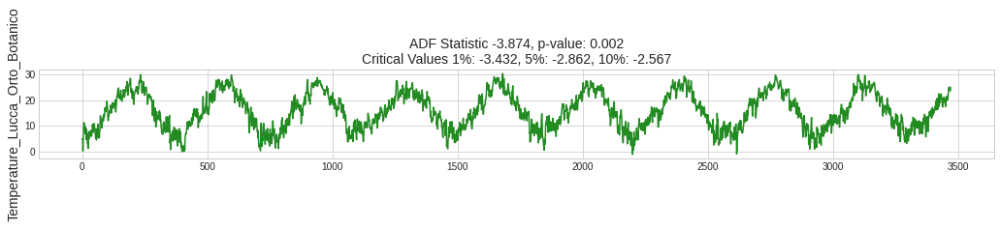

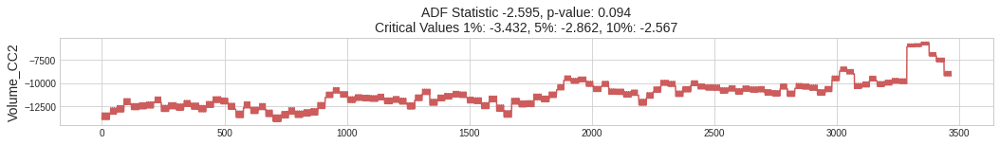

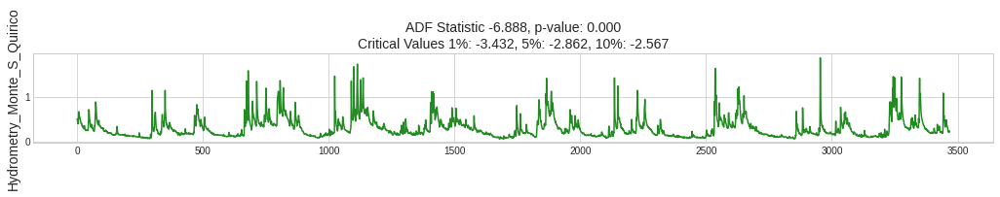

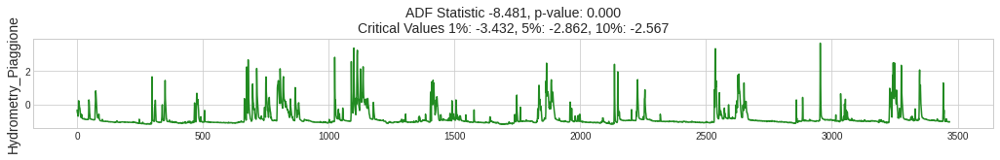

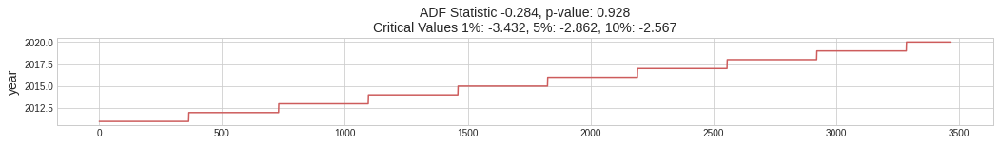

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[0].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[0][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

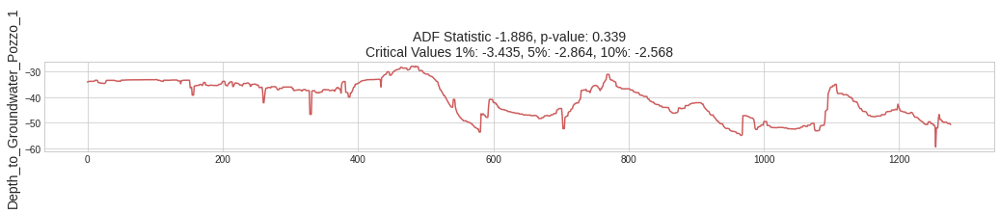

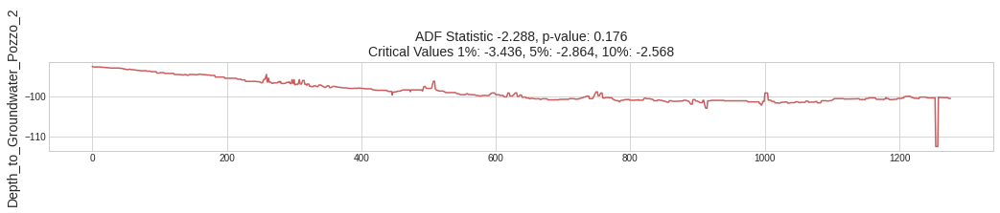

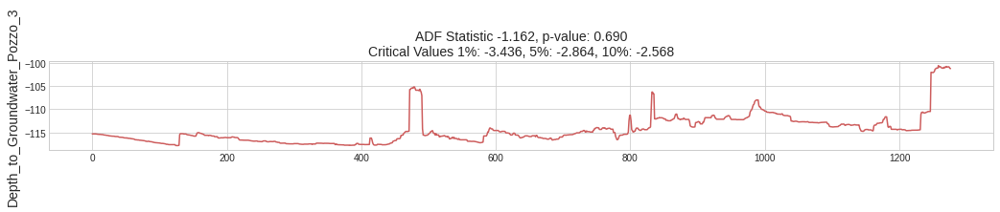

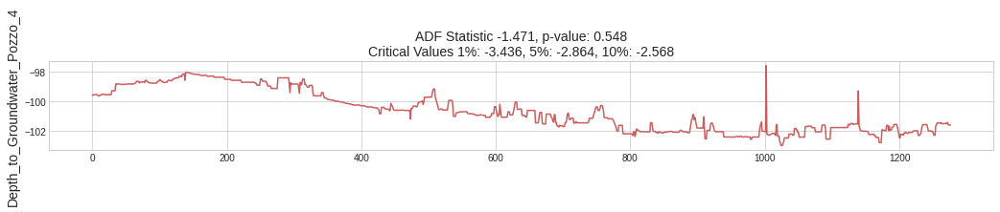

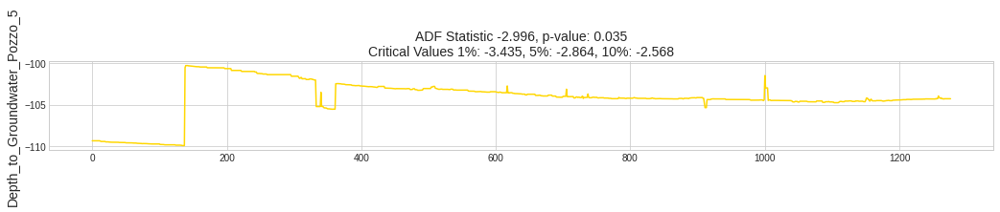

...

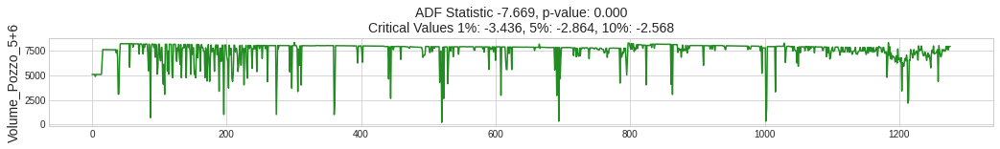

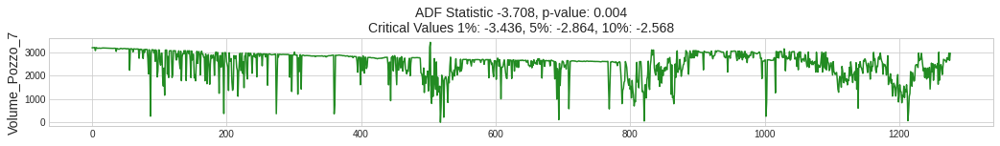

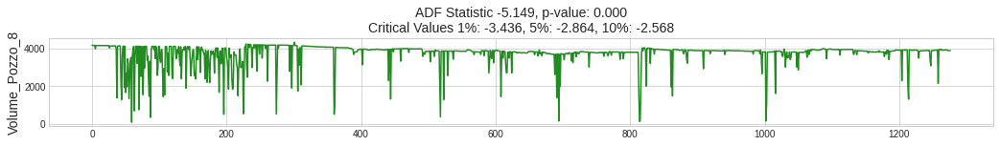

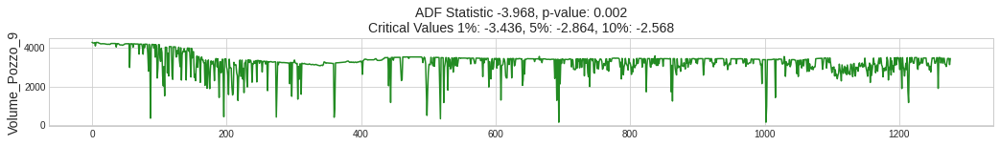

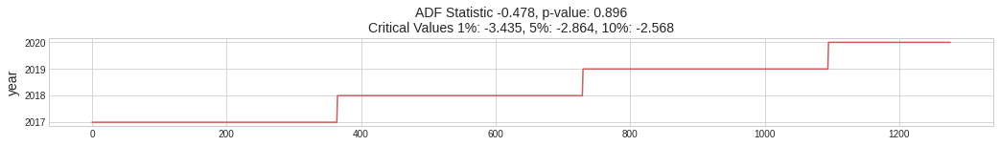

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[1].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[1][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
plt.show()

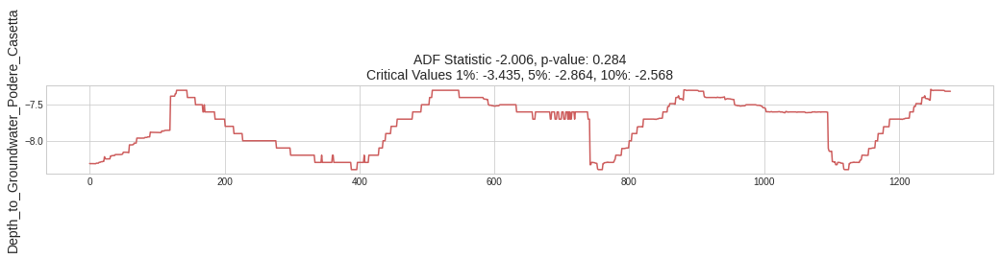

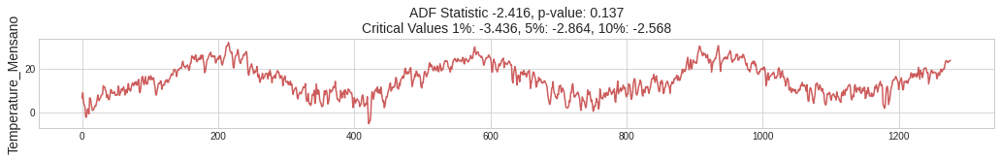

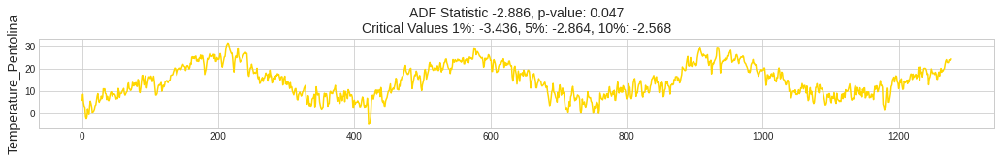

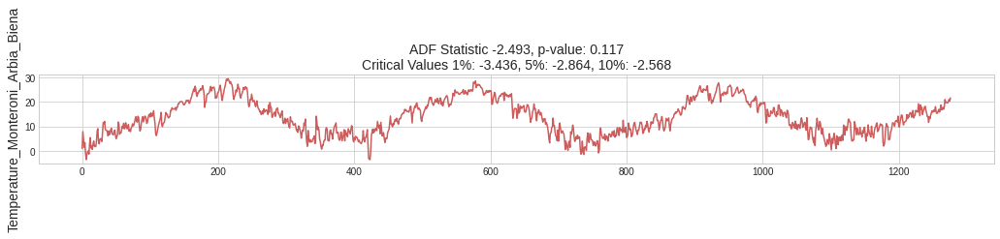

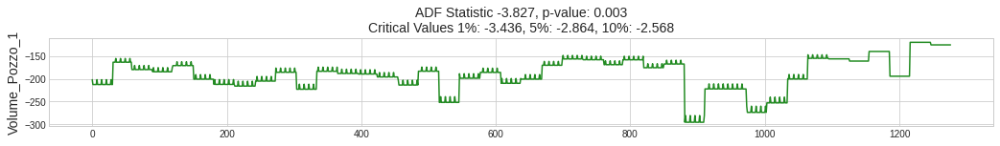

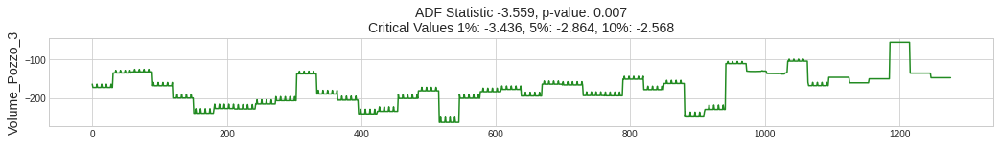

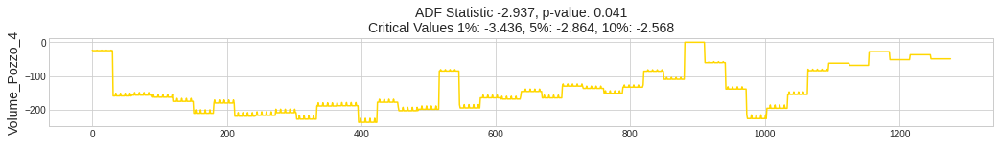

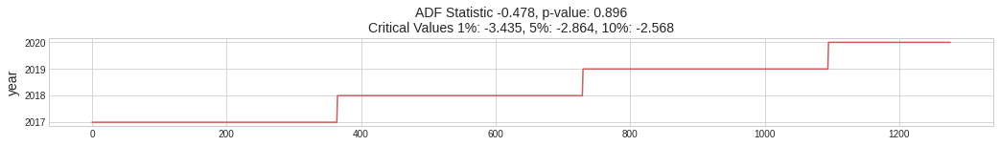

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[2].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[2][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

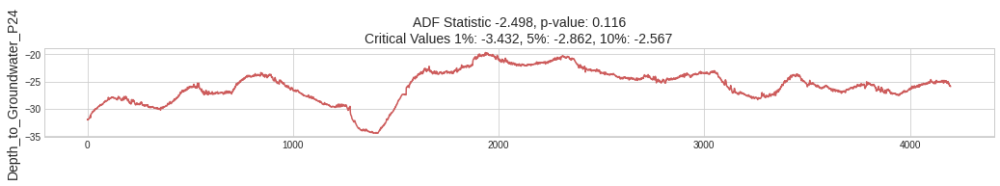

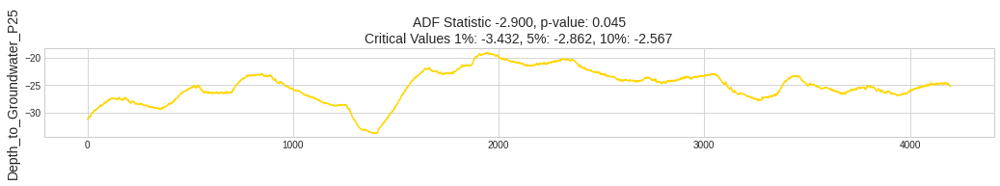

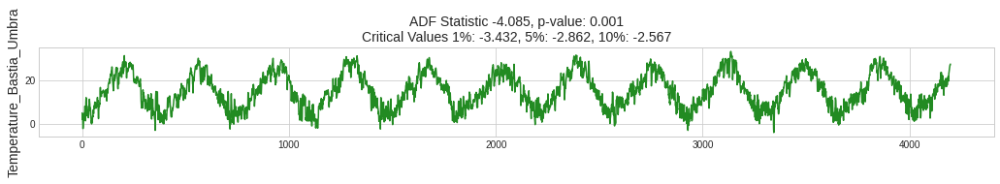

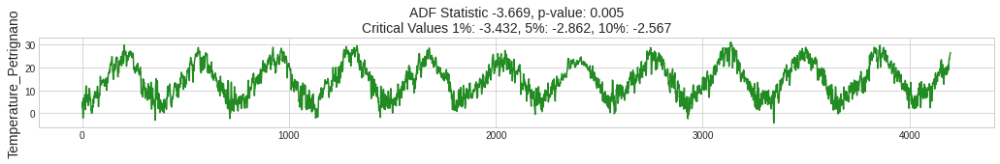

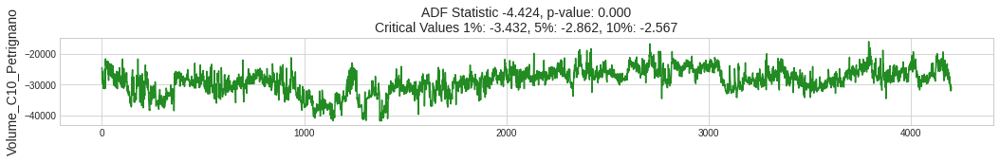

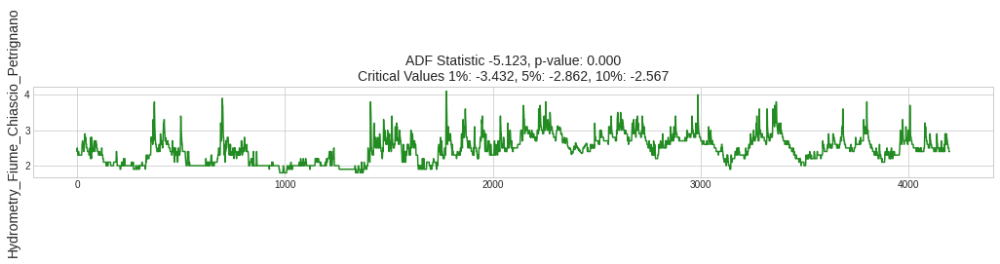

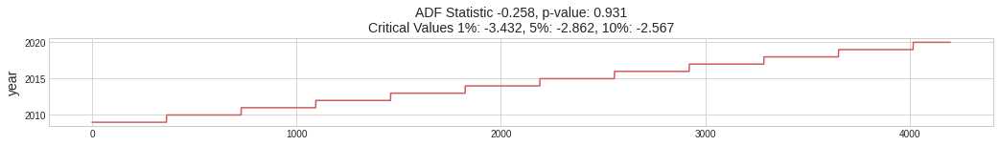

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[3].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[3][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

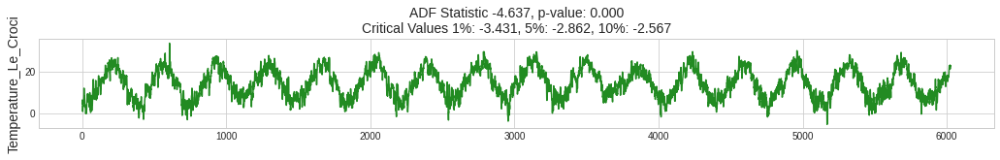

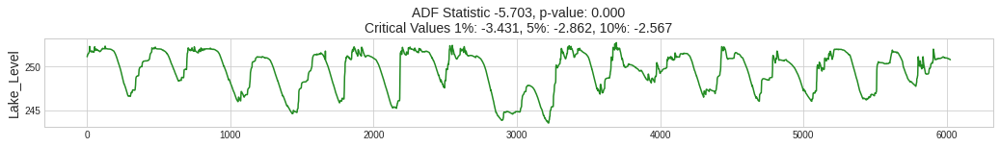

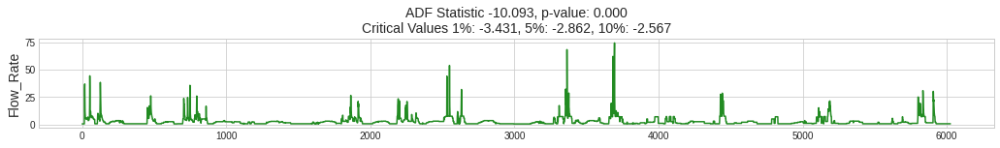

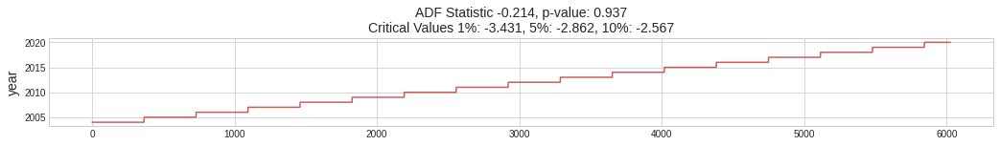

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[4].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[4][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

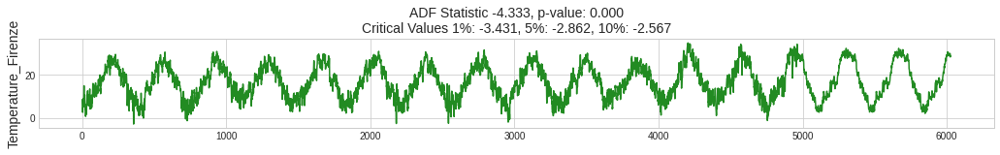

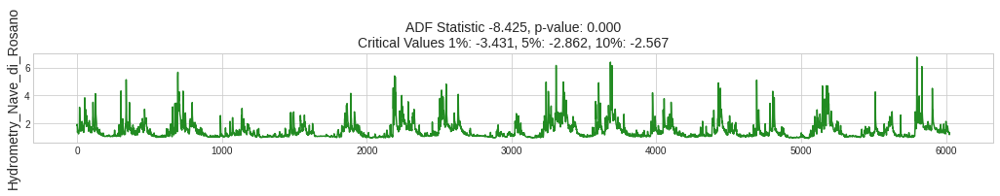

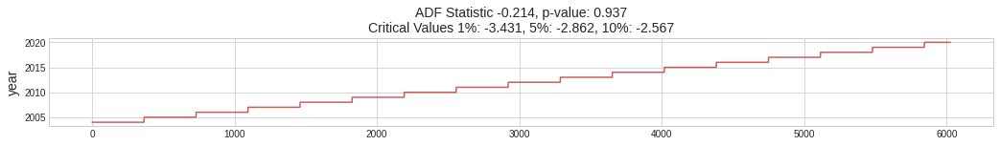

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[5].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[5][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

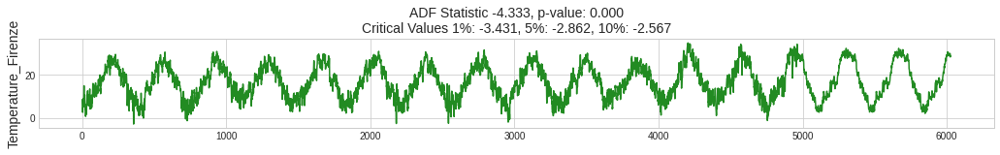

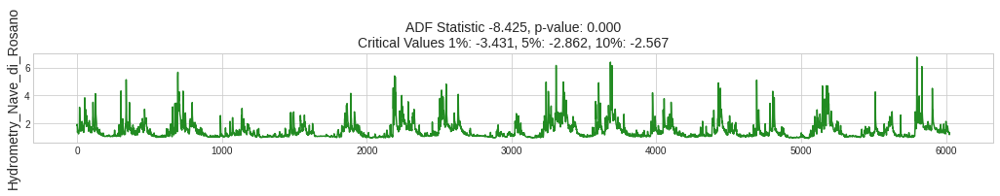

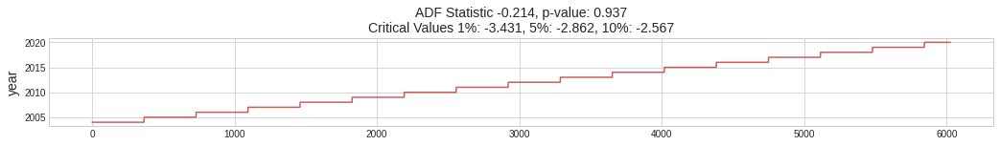

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[5].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[5][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

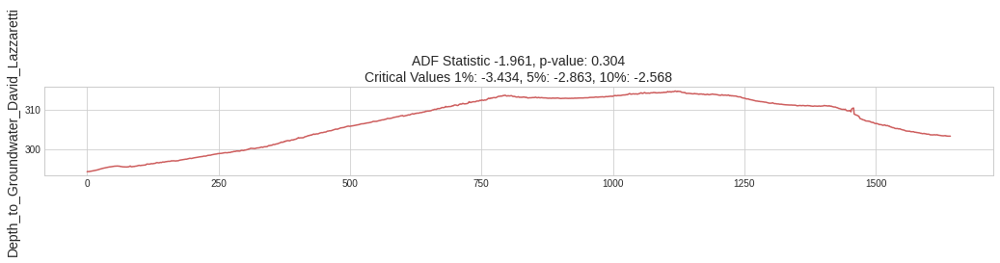

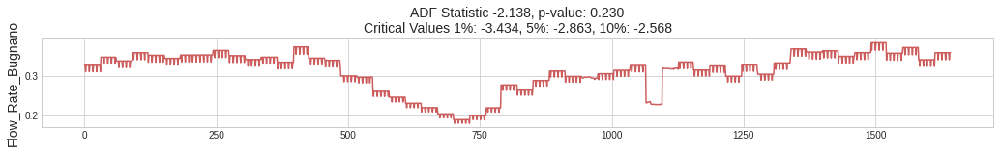

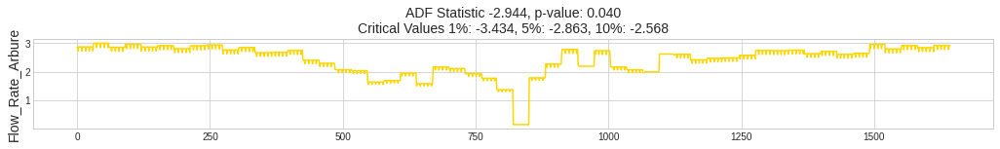

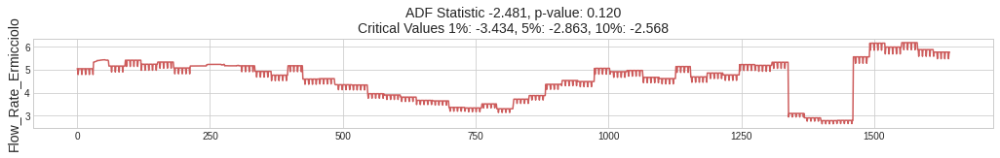

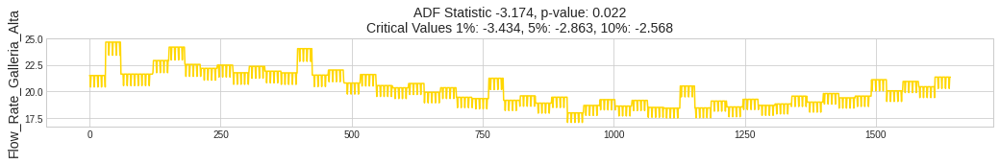

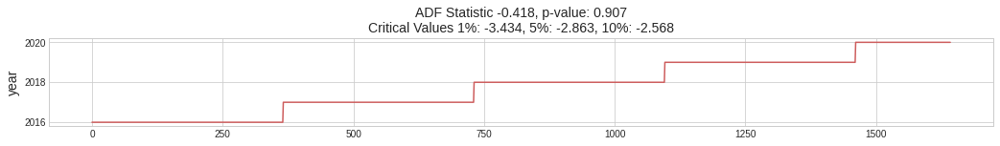

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[6].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[6][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

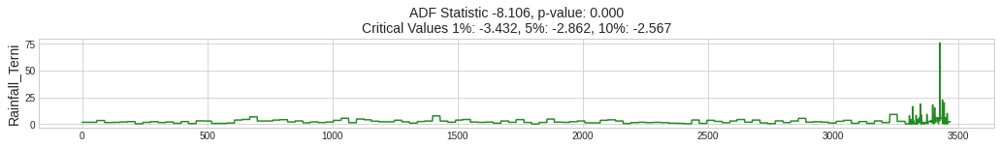

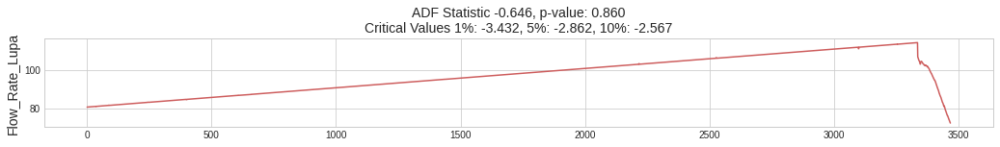

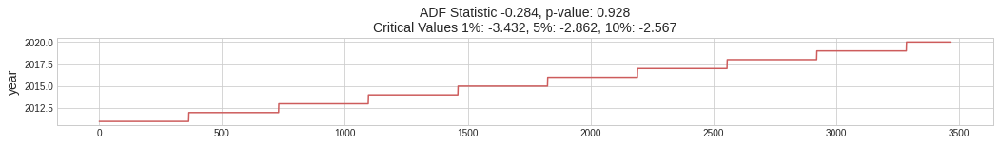

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[7].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[7][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

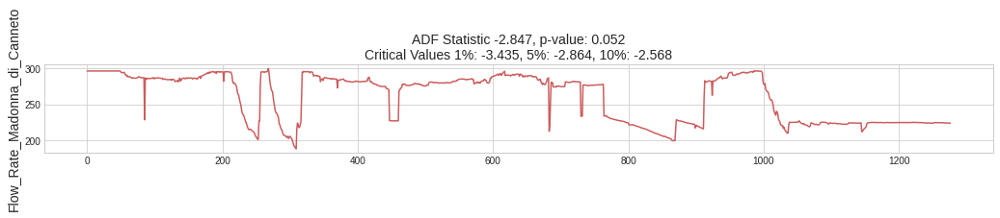

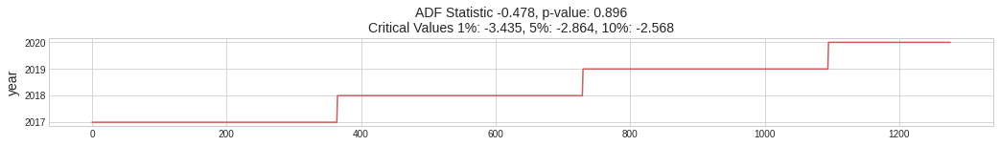

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[8].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[8][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

#Feature Engnineering

Adding Features consiting of Rolling Average of 7 days for better model accuracy(smootherns dataset) whilst keeping original attributes.

Dataset for Feature Engineering - Aquifer_Auser


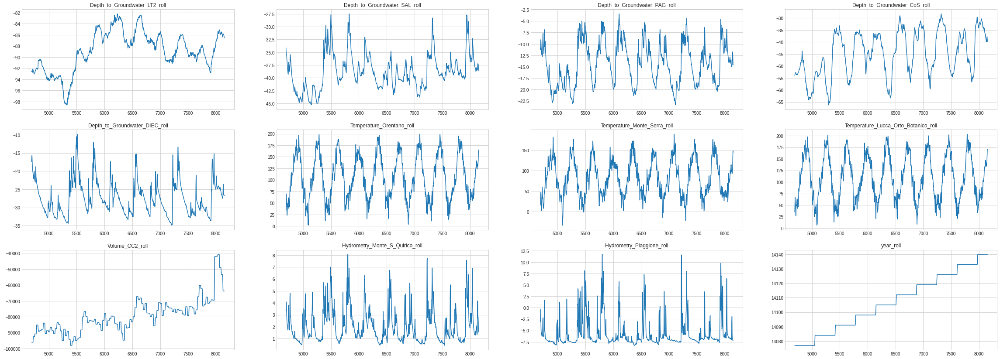

Dataset for Feature Engineering - Aquifer_Doganella


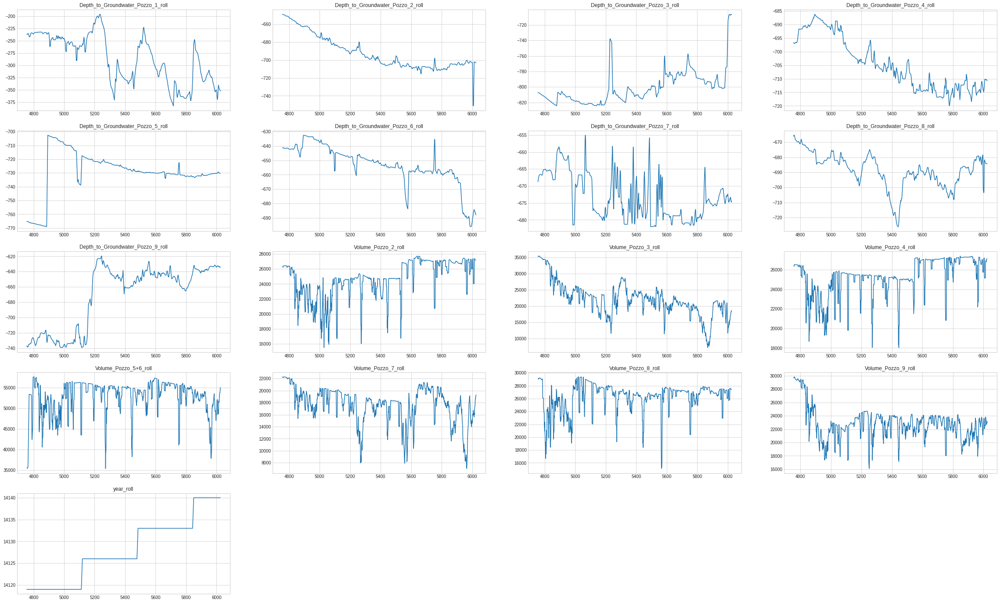

Dataset for Feature Engineering - Aquifer_Luco


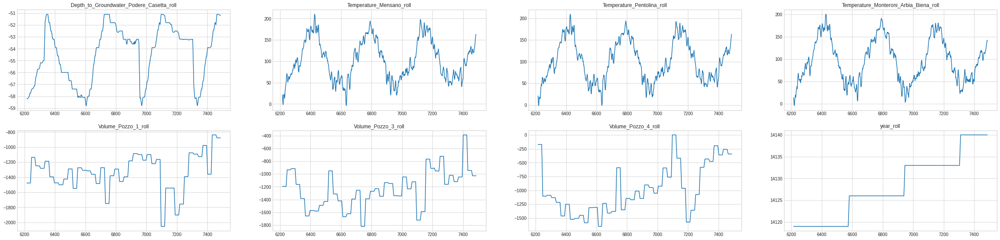

Dataset for Feature Engineering - Aquifer_Petrignano


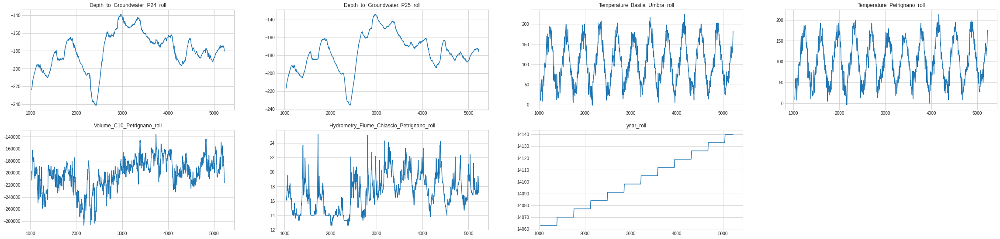

Dataset for Feature Engineering - Lake_Bilancino


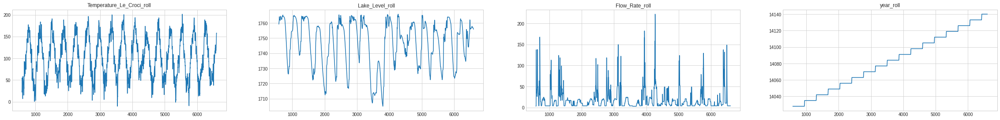

Dataset for Feature Engineering - River_Arno


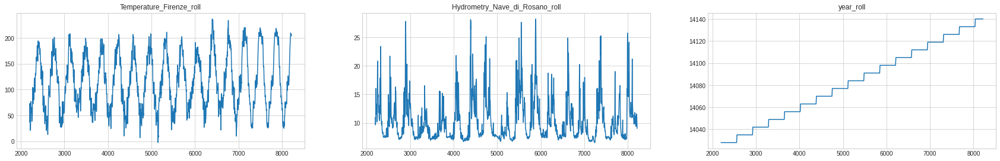

Dataset for Feature Engineering - Water_Spring_Amiata


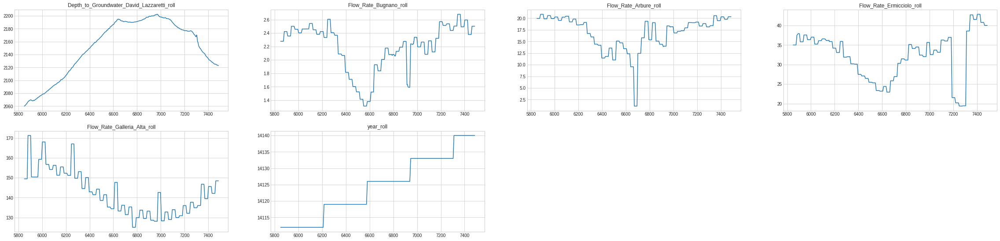

Dataset for Feature Engineering - Water_Spring_Lupa


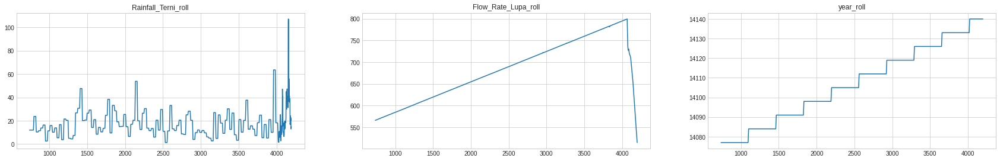

Dataset for Feature Engineering - Water_Spring_Madonna_di_Canneto


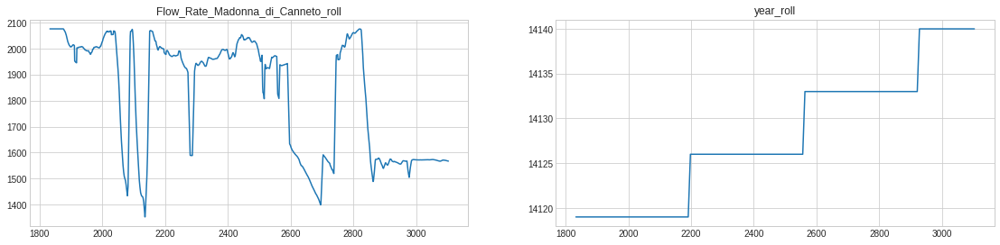

In [ ]:
def add_feat(acea_df):
  i=0
  plt.figure(figsize=(40,60))
  for cols in acea_df.columns:
    acea_df[cols+'_roll'] = acea_df[cols].rolling(7).sum()
    plt.subplot(12,4, i+1)
    plt.plot(acea_df[cols+'_roll'])
    plt.title(str(cols)+'_roll') 
    i=i+1
  plt.show()
  acea_df.dropna(axis=0,inplace=True)
  return acea_df

for i,(name,acea_df,acea_df_target) in enumerate(zip(dataset,all_data,all_data_target)):
    print("Dataset for Feature Engineering - " + str(name))
    all_data[i] = add_feat(acea_df)

# Models

Study of Multivariate Time Series¶
Now, we are going to understand deeper the behaviour of our time series and how they depend and influence each other in order to establish the proper model.

Remember, we want to create a robust model to predict Lake Level and Flow Rate in function of the last data. A Multivariate Time Series will analyse how much the time series depend each other. It adds information to have a forecasting more robust and more precise.

We want to find the variables we will use in our future model. We don't want to use variables that are not significant in the forecasting because it can skew our model.

## LSTM

In [ ]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
import tensorflow as tf
print(tf.__version__)
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
#import shap

2.4.1


We are going to use a multi-layered LSTM recurrent neural network to predict the last value of a sequence of values.

The following data pre-processing and feature engineering need to be done before construct the LSTM model.

Create the dataset, ensure all data is float.
Normalize the features.
Split into training and test sets.
Convert an array of values into a dataset matrix.
Reshape into X=t and Y=t+1.
Reshape input to be 3D (num_samples, num_timesteps, num_features).

Transforming Data set  for multivariate LSTM model

In [ ]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = pd.DataFrame(data)
	cols, names = list(), list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
	# put it all together
	agg = pd.concat(cols, axis=1)
	agg.columns = names
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg

Create LSTM Model

In [ ]:
def get_model(trainX):
        model = Sequential()
        model.add(LSTM(128, activation='relu',return_sequences=True, input_shape=(trainX.shape[1], trainX.shape[2])))
        model.add(Dropout(0.4))
        model.add(LSTM(64, activation='relu',return_sequences=True))
        model.add(Dropout(0.3))
        model.add(Dense(50))
        model.add(LSTM(32, activation='relu'))
        model.add(Dropout(0.3))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')
        return model

In [ ]:
def forecast(name,acea_df,acea_df_target):
    dataset = acea_df.copy()
    values = dataset.values
    # ensure all data is float
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 1, 1)
    # drop columns we don't want to predict
    cols_to_drop = [len(acea_df.columns) + acea_df.columns.get_loc(c) for c in acea_df if c not in acea_df_target]
    reframed.drop(reframed.columns[cols_to_drop], axis=1, inplace=True)
    values = reframed.values

    train_size = int(len(values) * 0.7)
    test_size = len(values) - train_size

    train, test = values[0:train_size,:], values[train_size:len(values),:]
    scale = MinMaxScaler(feature_range=(0, 1))
    scale.min_,scale.scale_ = scaler.min_[0],scaler.scale_[0]

    for i in range(1,len(acea_df.columns)-len(cols_to_drop)+1):
        trainX, trainY = train[:, :len(acea_df.columns)], train[:, -i]
        testX, testY = test[:, :len(acea_df.columns)], test[:, -i]

        trainX = trainX.reshape((trainX.shape[0], 1, trainX.shape[1]))
        testX = testX.reshape((testX.shape[0], 1, testX.shape[1]))

        """        model = get_model(trainX)
        grads = gradient_importance(trainX, model)
        print('Mean:', np.mean(grads))
        print('Standard Deviation:', np.std(grads))
        plt.figure(figsize=(10,8))
        plt.bar(acea_df.columns,grads)
        plt.xticks(acea_df.columns, rotation=90)
        plt.show()
        #|
        idx = np.nonzero((abs(grads) > 0.04))
        print("Selected Features - " + str(idx))

        foo = trainX[:,:,idx]
        trainX = np.squeeze(foo, axis=(1,))
        foo = testX[:,:,idx]
        testX = np.squeeze(foo, axis=(1,))
        """
        model = get_model(trainX)
        history = model.fit(trainX, trainY, epochs=100, batch_size=64, validation_data=(testX, testY), verbose=0, shuffle=False)
        
        yhat = model.predict(testX)
        testX = testX.reshape((testX.shape[0], testX.shape[2]))

        inv_yhat = np.concatenate((yhat, testX[:, 1:]), axis=1)
        inv_yhat = scale.inverse_transform(inv_yhat)
        inv_yhat = inv_yhat[:,0]

        testY = testY.reshape((len(testY), 1))
        inv_y = np.concatenate((testY, testX[:, 1:]), axis=1)
        inv_y = scale.inverse_transform(inv_y)
        inv_y = inv_y[:,0]

        rmse = math.sqrt(mean_squared_error(inv_y, inv_yhat))
        mae = mean_absolute_error(inv_y, inv_yhat)
        print('Test RMSE: %.3f' % rmse)
        print('Test MAE: %.3f' % mae)
        plt.figure(figsize=(20,30))
      
        plt.subplot(12,2,1)        
        sns.scatterplot(x=np.linspace(0,len(inv_y),num=len(inv_y)), y=inv_y, color='black',label='Actual')
        sns.scatterplot(x=np.linspace(0,len(inv_yhat),num=len(inv_yhat)), y=inv_yhat, color='green',label='predicted')
        plt.title(acea_df_target[i-1])
        plt.legend()
       
        plt.subplot(12,2,2)
        plt.plot(history.history['loss'], label='train')
        plt.plot(history.history['val_loss'], label='test')
        plt.legend()
        
        actual.append(inv_y)
        predicted.append(inv_yhat)
        targets.append(acea_df_target[i-1])
        rmses.append(rmse)
        maes.append(mae)
        
    plt.show()
    return actual,predicted,targets,history,rmses,maes

In [ ]:
def gradient_importance(seq, model):
    seq = tf.Variable(seq, dtype=tf.float32)
    with tf.GradientTape() as tape:
        predictions = model(seq)
    grads = tape.gradient(predictions, seq)
    grads = tf.reduce_mean(grads, axis=1).numpy()[0]
    return grads

In [ ]:
"""acea_df = data_impute(Water_Spring_Lupa)
forecast(acea_df,Water_Spring_Lupa_target)"""

'acea_df = data_impute(Water_Spring_Lupa)\nforecast(acea_df,Water_Spring_Lupa_target)'

Test RMSE: 0.090
Test MAE: 0.072
Test RMSE: 0.156
Test MAE: 0.116
Test RMSE: 0.085
Test MAE: 0.071


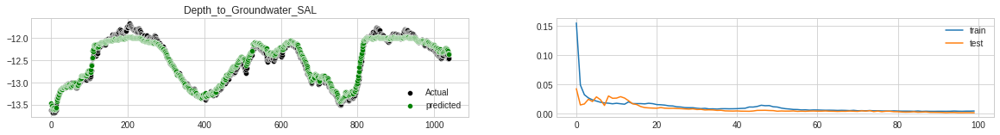

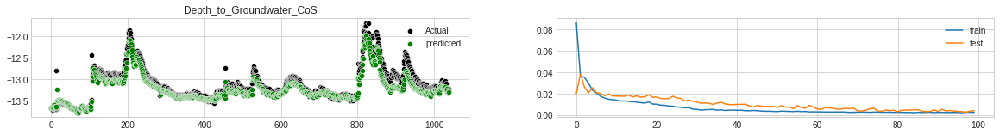

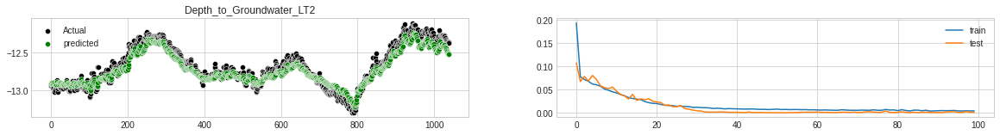

Test RMSE: 1.590
Test MAE: 1.369
Test RMSE: 2.219
Test MAE: 1.355
Test RMSE: 1.891
Test MAE: 1.448
Test RMSE: 3.544
Test MAE: 2.293
Test RMSE: 0.814
Test MAE: 0.504
Test RMSE: 2.644
Test MAE: 1.855
Test RMSE: 2.730
Test MAE: 1.827
Test RMSE: 2.050
Test MAE: 0.899
Test RMSE: 2.799
Test MAE: 2.284


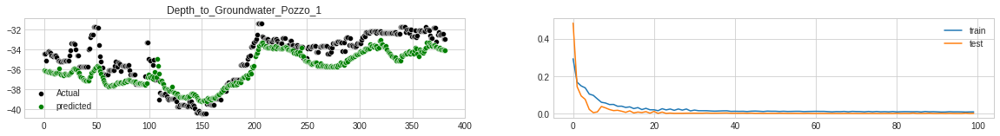

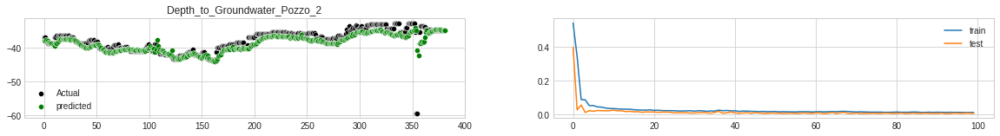

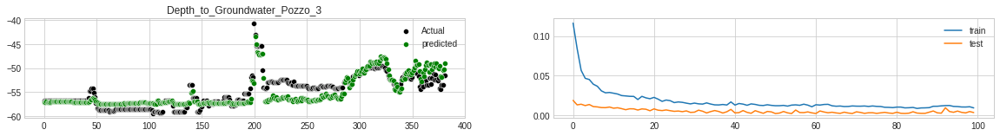

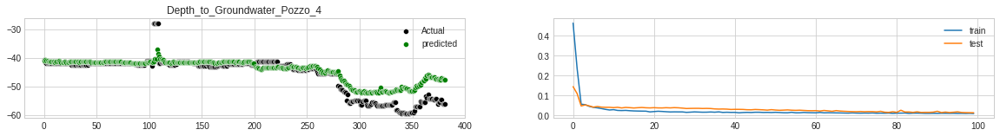

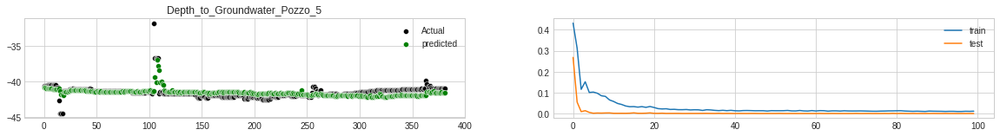

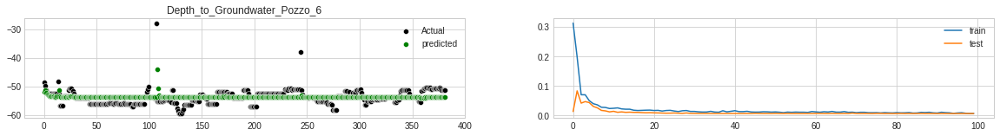

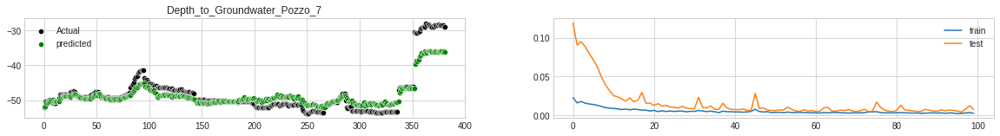

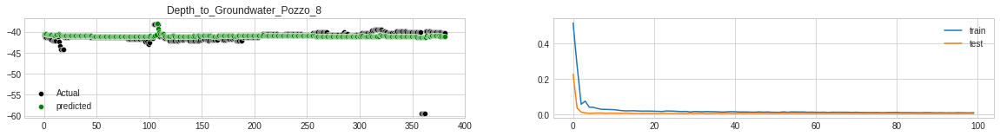

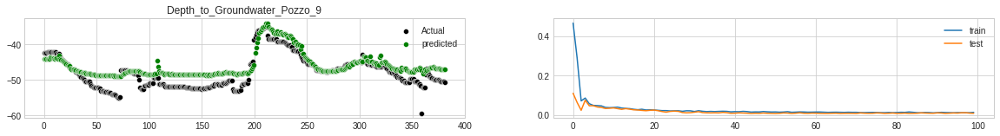

Test RMSE: 0.071
Test MAE: 0.055


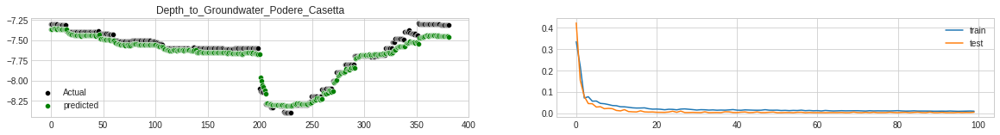

Test RMSE: 0.592
Test MAE: 0.524
Test RMSE: 0.704
Test MAE: 0.618


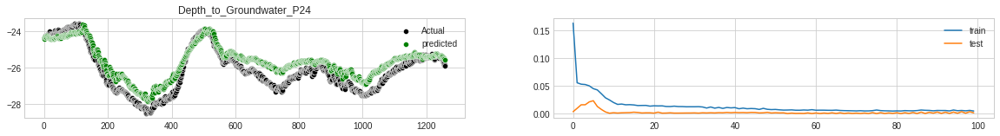

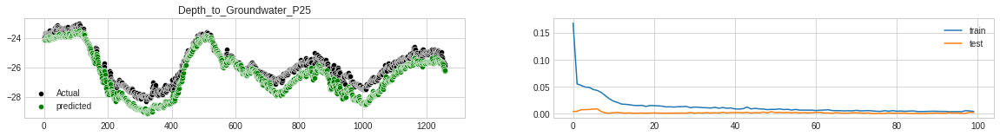

Test RMSE: 0.819
Test MAE: 0.279
Test RMSE: 2.093
Test MAE: 1.789


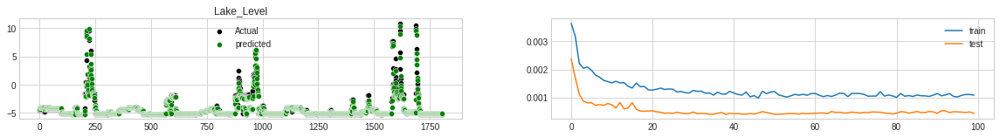

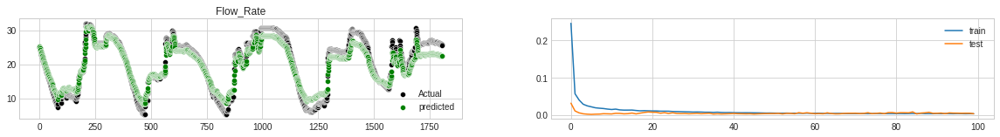

Test RMSE: 1.931
Test MAE: 0.971


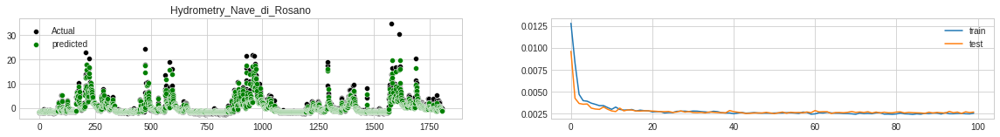

Test RMSE: 2.054
Test MAE: 1.646
Test RMSE: 4.300
Test MAE: 3.788
Test RMSE: 1.155
Test MAE: 1.011
Test RMSE: 1.487
Test MAE: 1.174


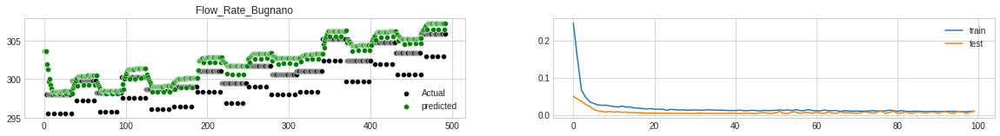

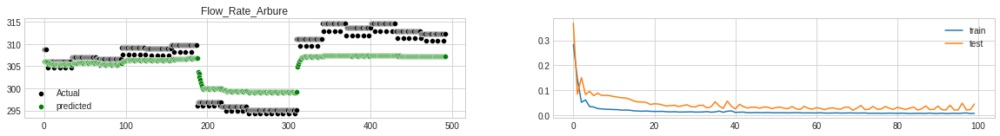

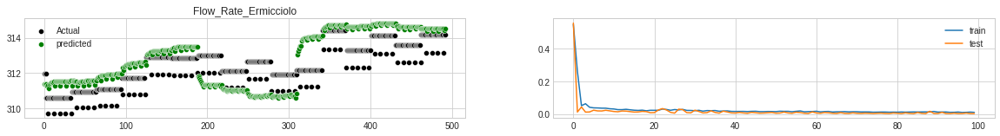

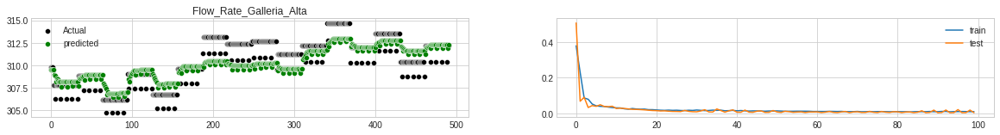

Test RMSE: 16.694
Test MAE: 14.020


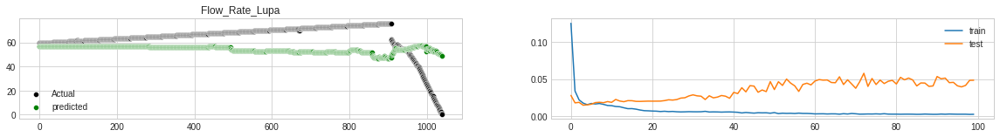

Test RMSE: 6.478
Test MAE: 4.478


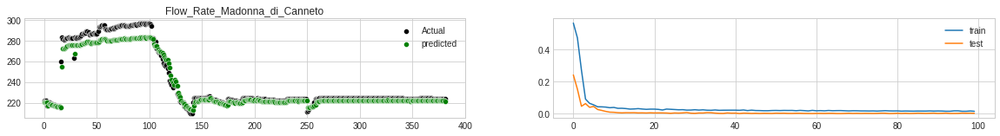

In [ ]:
actual = []
predicted = []
targets = []
rmses = []
maes = []
maes_train = []
rmses_train = []
for name,acea_df,acea_df_target in zip(dataset,all_data,all_data_target):
  actual,predicted,targets,history,rmses,maes= forecast(name,acea_df,acea_df_target)

In [ ]:
errors = pd.DataFrame(list(zip(rmses_train, maes_train,rmses, maes)), 
                      index=all_targets, columns=['Train RMSE','Train MAE','Test RMSE','Test MAE'])
errors.to_csv('error.csv')
errors

,Train RMSE,Train MAE,Test RMSE,Test MAE
Depth_to_Groundwater_SAL,NaN,NaN,NaN,NaN
Depth_to_Groundwater_CoS,NaN,NaN,NaN,NaN
Depth_to_Groundwater_LT2,NaN,NaN,NaN,NaN
Depth_to_Groundwater_Pozzo_1,NaN,NaN,NaN,NaN
Depth_to_Groundwater_Pozzo_2,NaN,NaN,NaN,NaN
Depth_to_Groundwater_Pozzo_3,NaN,NaN,NaN,NaN
Depth_to_Groundwater_Pozzo_4,NaN,NaN,NaN,NaN
Depth_to_Groundwater_Pozzo_5,NaN,NaN,NaN,NaN
Depth_to_Groundwater_Pozzo_6,NaN,NaN,NaN,NaN
Depth_to_Groundwater_Pozzo_7,NaN,NaN,NaN,NaN


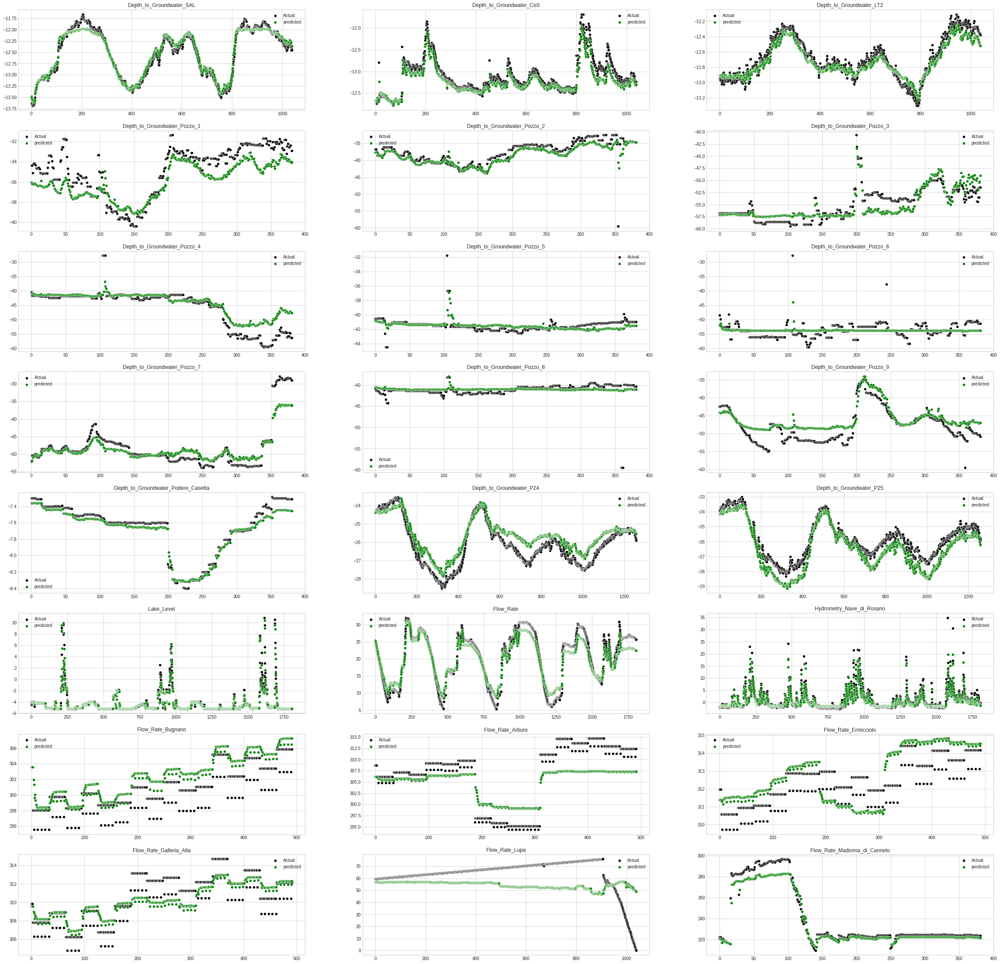

In [ ]:
plt.figure(figsize=(40,50))
for i,(act,pred,name) in enumerate(zip(actual,predicted,targets)):
  plt.subplot(10,3,i+1)
  sns.scatterplot(x=np.linspace(0,len(act),num=len(act)), y=act, color='black',label='Actual')
  sns.scatterplot(x=np.linspace(0,len(pred),num=len(pred)), y=pred, color='green',label='predicted')
  plt.title(name)
  plt.legend()
plt.show()

## XGBOOST

In [ ]:
# Aquifer_Doganella.columns

In [ ]:
"""import xgboost as xgb
from sklearn.model_selection import KFold, train_test_split, GridSearchCV

# # define model
model = xgb.XGBRegressor()
"""

In [ ]:
# from sklearn.metrics import mean_squared_error, mean_absolute_error

# print("Parameter optimization")
# xgb_model = xgb.XGBRegressor(n_jobs=1)
# clf = GridSearchCV(xgb_model,scoring = 'neg_mean_absolute_error',
#                    param_grid = {'max_depth': [2, 4, 6],
#                     'n_estimators': [50, 100, 200]}, verbose=1, n_jobs=1)
# clf.fit(X.values, y.values)
# print(clf.best_score_)
# print(clf.best_params_)
# param = clf.best_params_

In [ ]:
# xgb_model = xgb.XGBRegressor(max_depth=4,n_estimators=50).fit(X_train.values, y_train.values)
# predictions = xgb_model.predict(X_test.values)
# actuals = y_test.values
# print('MSE: ')
# print(mean_squared_error(actuals, predictions))
# print('MAE: ')
# print(mean_absolute_error(actuals,predictions))
    
# xgb.plot_importance(xgb_model) 

In [ ]:
# plt.plot(actuals)
# plt.plot(predictions)

## ARIMA

In [ ]:
"""!pip install chart_studio
import chart_studio.plotly as ply
import cufflinks as cf

!pip install pmdarima
import pmdarima as pm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import warnings
from math import sqrt

from pandas import datetime
from sklearn.metrics import mean_squared_error"""

In [ ]:
"""fig, axes = plt.subplots(3, 2, sharex=True)

axes[0, 0].plot(df.Depth_to_Groundwater_Pozzo_1); 
axes[0, 0].set_title('Original Series')
plot_acf(df.Depth_to_Groundwater_Pozzo_1.squeeze(), ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(df.Depth_to_Groundwater_Pozzo_1.diff()); 
axes[1, 0].set_title('1st Order Differencing')
plot_acf(df.Depth_to_Groundwater_Pozzo_1.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(df.Depth_to_Groundwater_Pozzo_1.diff().diff()); 
axes[2, 0].set_title('2nd Order Differencing')
plot_acf(df.Depth_to_Groundwater_Pozzo_1.diff().diff().dropna(), ax=axes[2, 1])

plt.show()"""

In [ ]:
"""def evaluate_arima_model(X, arima_order):
	# prepare training dataset
	train_size = int(len(X) * 0.66)
	train, test = X[0:train_size], X[train_size:]
	history = [x for x in train]
	# make predictions
	predictions = list()
	for t in range(len(test)):
		model = ARIMA(history, order=arima_order)
		model_fit = model.fit()
		yhat = model_fit.forecast()[0]
		predictions.append(yhat)
		history.append(test[t])
	# calculate out of sample error
	rmse = sqrt(mean_squared_error(test, predictions))
	return rmse
 
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values):
	dataset = dataset.astype('float32')
	best_score, best_cfg = float("inf"), None
	for p in p_values:
		for d in d_values:
			for q in q_values:
				order = (p,d,q)
				try:
					rmse = evaluate_arima_model(dataset, order)
					if rmse < best_score:
						best_score, best_cfg = rmse, order
					print('ARIMA%s RMSE=%.3f' % (order,rmse))
				except:
					continue
	print('Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))
 
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")
evaluate_models(df.values, p_values, d_values, q_values)"""

In [ ]:
"""model = pm.auto_arima(df.Depth_to_Groundwater_Pozzo_1, start_p=1, start_q=1,
                          test='adf',  # use adftest to find optimal 'd'
                          max_p=5, max_q=5,  # maximum p and q
                          m=4,  # frequency of series
                          d=None,  # let model determine 'd'
                          seasonal=True,  # No Seasonality
                          start_P=0,
                          D=0,
                          trace=True,
                          error_action='ignore',
                          suppress_warnings=True)"""

In [ ]:
"""stepwise_model.summary()
stepwise_model.fit(train).fit(train)
pred = pd.DataFrame(stepwise_model.fit(train).predict(n_periods = len(test)),index=test.index)
pred.columns = ['pred']
pred
plt.plot(train,label="train")
plt.plot(test,label="test")
plt.plot(pred,label="pred")"""